# Hands On with Simple Linear Regression
## Goal for practice
### 1. Performan simple linear regression with SKlearn
### 2. Use model performance KPIs to evaluate model performance
### 3. Perform residule diagnostic and decide proper treatment before fit the model
### 4. Implement SLR with gradient descent algorithm

We have learnt Simple(SLR) Linear Regression, let's use some data to do some hands on work. The data provided is a synthesized data let's fit model with sklearn

#### Load important library

In [32]:
import math
import pandas as pd  
import numpy as np  
import os
import matplotlib.pyplot as plt  
import seaborn as seabornInstance 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
%matplotlib inline

In [3]:
path = ""
data1b = "train.csv"
data1t = "test.csv"
data2b = "train2.csv"
data2t = "test2.csv"
data3b = "train3.csv"
data3t = "test3.csv"
print(os.path.join(path, data1b))

train.csv


# Read Data

In [4]:
dt1b = pd.read_csv(data1b)
dt1t = pd.read_csv(data1t)
dt2b = pd.read_csv(data2b)
dt2t = pd.read_csv(data2t)
dt3b = pd.read_csv(data3b)
dt3t = pd.read_csv(data3t)

# Practice 1 - Use "train.csv" and "test.csv" build simple linear model 

### Check data quality and scatter plot
#### 1 - head
#### 2 - check null
#### 3 - scatter plot
#### 4 - Train model with model evaluation
#### 5 - check residual plot and diagnostics

In [5]:
print("Train data size: {}".format(dt1b.shape))
print("Test data size: {}".format(dt1t.shape))

Train data size: (700, 2)
Test data size: (300, 2)


In [6]:
dt1b.head()

,x,y
0,24.0,21.549452
1,50.0,47.464463
2,15.0,17.218656
3,38.0,36.586398
4,87.0,87.288984


In [7]:
dt1t.head()

,x,y
0,77,79.775152
1,21,23.177279
2,22,25.609262
3,20,17.857388
4,36,41.849864


In [8]:
dt1b.describe()

,x,y
count,700.000000,699.000000
mean,54.985939,49.939869
std,134.681703,29.109217
min,0.000000,-3.839981
25%,25.000000,24.929968
50%,49.000000,48.973020
75%,75.000000,74.929911
max,3530.157369,108.871618


In [9]:
dt1t.describe()

,x,y
count,300.000000,300.000000
mean,50.936667,51.205051
std,28.504286,29.071481
min,0.000000,-3.467884
25%,27.000000,25.676502
50%,53.000000,52.170557
75%,73.000000,74.303007
max,100.000000,105.591837


In [10]:
print("Train data misscnt: {}".format(dt1b.isnull().sum()))
print("Test data misscnt: {}".format(dt1t.isnull().sum()))

Train data misscnt: x    0
y    1
dtype: int64
Test data misscnt: x    0
y    0
dtype: int64


Noticed train data has a missing value in target , we have to remove the missing value before fit model, 
otherwise you will get error message. Dropna and double check the missing row was removed

In [11]:
dt1b = dt1b.dropna().copy()
print("Train data size: {}".format(dt1b.shape))
print("Test data size: {}".format(dt1t.shape))

Train data size: (699, 2)
Test data size: (300, 2)


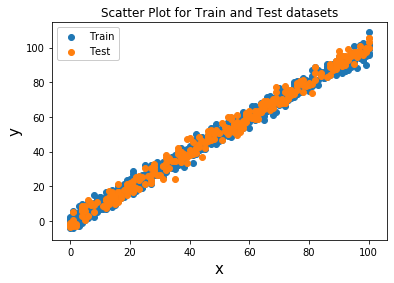

In [12]:
plt.scatter((dt1b['x']),dt1b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter((dt1t['x']),dt1t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

We retrieve the independent(x) and dependent(y) variables and since we have only one feature(x) 
we reshape them so that we could feed them into our linear regression model.

In [13]:
x_train = dt1b['x']
y_train = dt1b['y']
x_test = dt1t['x']
y_test = dt1t['y']

x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)

x_train = x_train.reshape(-1,1)
x_test = x_test.reshape(-1,1)

Fit model and get the intercept and coefficent

In [14]:
#from sklearn.linear_model import LinearRegression
reg = LinearRegression(normalize=True)
reg.fit(x_train,y_train)
y_pred = reg.predict(x_test)
print(r2_score(y_test,y_pred))
print(mean_squared_error(y_test,y_pred))

0.9888014444327563
9.43292219203932


In [15]:
print("intercept: {}".format(reg.intercept_))

intercept: -0.1072654643009372


In [16]:
print("coeffcient: {}".format(reg.coef_))

coeffcient: [1.00065638]


Therefore the fitted line : y = -0.10726546430095851 + 1.00065638*x

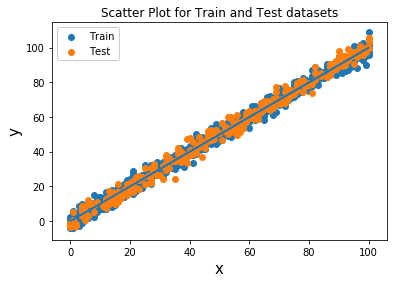

In [17]:
plt.scatter(dt1b['x'],dt1b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter((dt1t['x']),dt1t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

plt.plot(dt1b['x'], (-0.10726546430095851 + 1.00065638*dt1b['x']))

How about build sample residual?

In [18]:
y_pred_b = reg.predict(x_train)
residual = y_train - y_pred_b

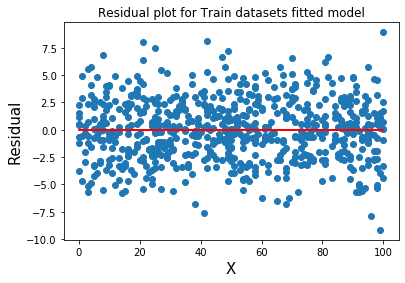

In [19]:
plt.scatter((dt1b['x']),residual)
plt.title("Residual plot for Train datasets fitted model")
plt.xlabel("X", fontsize=15)
plt.ylabel("Residual", fontsize=15)
plt.plot(dt1b['x'], 0*dt1b['x'], color="r")

Residule distributed around zero randomly, the model fit is adequate 

# Practice 2 - Use "train2.csv" and "test2.csv" build simple linear model, did you observe any special trends? How to improve the model fit

Below code give a initial scripts to look into data, 
please take sometime following majority steps of practice 1 to tackle this problem 

In [20]:
print("Train data size: {}".format(dt2b.shape))
print("Test data size: {}".format(dt2t.shape))

Train data size: (700, 2)
Test data size: (300, 2)


In [21]:
dt2b.head()

,x,y
0,576.0,21.549452
1,2500.0,47.464463
2,225.0,17.218656
3,1444.0,36.586398
4,7569.0,87.288984


In [22]:
dt2t.head()

,x,y
0,5929,79.775152
1,441,23.177279
2,484,25.609262
3,400,17.857388
4,1296,41.849864


In [23]:
dt2b.describe()

,x,y
count,7.000000e+02,699.000000
mean,2.113670e+04,49.939869
std,4.709034e+05,29.109217
min,0.000000e+00,-3.839981
25%,6.250000e+02,24.929968
50%,2.401000e+03,48.973020
75%,5.625000e+03,74.929911
max,1.246201e+07,108.871618


In [24]:
dt2t.describe()

,x,y
count,300.000000,300.000000
mean,3404.330000,51.205051
std,2996.644856,29.071481
min,0.000000,-3.467884
25%,729.000000,25.676502
50%,2809.000000,52.170557
75%,5329.000000,74.303007
max,10000.000000,105.591837


In [25]:
print("Train data misscnt: {}".format(dt2b.isnull().sum()))
print("Test data misscnt: {}".format(dt2t.isnull().sum()))

Train data misscnt: x    0
y    1
dtype: int64
Test data misscnt: x    0
y    0
dtype: int64


In [26]:
dt2b = dt2b.dropna().copy()
print("Train data size: {}".format(dt2b.shape))
print("Test data size: {}".format(dt2t.shape))

Train data size: (699, 2)
Test data size: (300, 2)


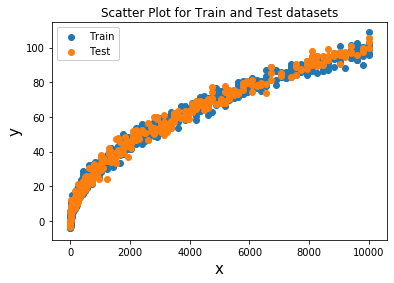

In [27]:
plt.scatter((dt2b['x']),dt2b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter((dt2t['x']),dt2t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

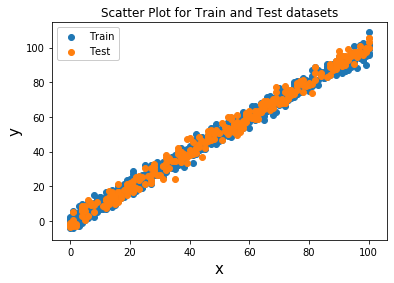

In [35]:
# need transformation
plt.scatter(np.sqrt(dt2b['x']),dt2b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter(np.sqrt(dt2t['x']),dt2t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

In [36]:
x_train2 = dt2b['x']
y_train2= dt2b['y']
x_test2 = dt2t['x']
y_test2 = dt2t['y']

x_train2 = np.array(x_train2)
y_train2 = np.array(y_train2)
x_test2 = np.array(x_test2)
y_test2 = np.array(y_test2)

x_train2 = x_train2.reshape(-1,1)
x_test2 = x_test2.reshape(-1,1)

In [37]:
reg.fit(np.sqrt(x_train2),y_train2)
y_pred2 = reg.predict(np.sqrt(x_test2))
print(r2_score(y_test2,y_pred2))
print(mean_squared_error(y_test2,y_pred2))

0.9888014444327563
9.432922192039317


In [38]:
print("intercept: {}".format(reg.intercept_))

intercept: -0.1072654643009372


In [39]:
print("coeffcient: {}".format(reg.coef_))

coeffcient: [1.00065638]


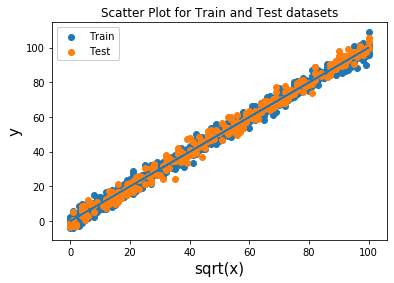

In [42]:
plt.scatter(np.sqrt(dt2b['x']),dt2b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("sqrt(x)", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter(np.sqrt(dt2t['x']),dt2t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

plt.plot(np.sqrt(dt2b['x']), (-0.1072654643009372 + 1.00065638*np.sqrt(dt2b['x'])))

In [43]:
y_pred_b2 = reg.predict(np.sqrt(x_train2))
residual2 = y_train2 - y_pred_b2

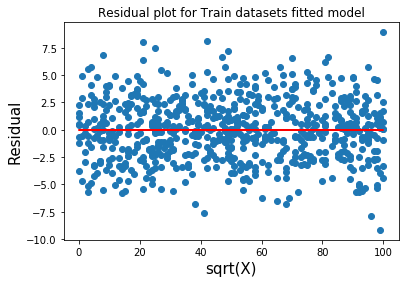

In [44]:
plt.scatter(np.sqrt(dt2b['x']),residual2)
plt.title("Residual plot for Train datasets fitted model")
plt.xlabel("sqrt(X)", fontsize=15)
plt.ylabel("Residual", fontsize=15)
plt.plot(np.sqrt(dt2b['x']), 0*dt2b['x'], color="r")

# Practice 3 - Use "train3.csv" and "test3.csv" build simple linear model, did you observe any special trends? How to improve the model fit

In [51]:
print("Train data size: {}".format(dt3b.shape))
print("Test data size: {}".format(dt3t.shape))

Train data size: (700, 2)
Test data size: (300, 2)


In [52]:
dt3b.head()

,x,y
0,24.0,464.378880
1,50.0,2252.875253
2,15.0,296.482126
3,38.0,1338.564521
4,87.0,7619.366709


In [53]:
dt3t.head()

,x,y
0,77,6364.074878
1,21,537.186256
2,22,655.834278
3,20,318.886311
4,36,1751.411149


In [54]:
dt3b.describe()

,x,y
count,700.000000,699.000000
mean,54.985939,3340.124826
std,134.681703,3055.712556
min,0.000000,0.014850
25%,25.000000,621.515765
50%,49.000000,2398.356724
75%,75.000000,5614.501316
max,3530.157369,11853.029271


In [55]:
dt3t.describe()

,x,y
count,300.000000,300.000000
mean,50.936667,3464.291087
std,28.504286,3082.356336
min,0.000000,0.075794
25%,27.000000,659.283348
50%,53.000000,2721.780348
75%,73.000000,5520.944197
max,100.000000,11149.636147


In [56]:
print("Train data misscnt: {}".format(dt3b.isnull().sum()))
print("Test data misscnt: {}".format(dt3t.isnull().sum()))

Train data misscnt: x    0
y    1
dtype: int64
Test data misscnt: x    0
y    0
dtype: int64


In [57]:
dt3b = dt3b.dropna().copy()
print("Train data size: {}".format(dt3b.shape))
print("Test data size: {}".format(dt3t.shape))

Train data size: (699, 2)
Test data size: (300, 2)


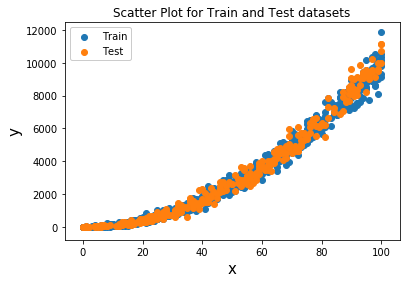

In [58]:
plt.scatter((dt3b['x']),dt3b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter((dt3t['x']),dt3t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

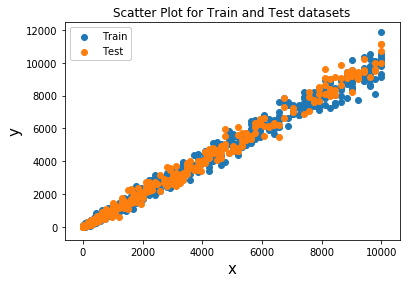

In [59]:
plt.scatter(dt3b['x']**2,dt3b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter(dt3t['x']**2,dt3t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

In [60]:
x_train3 = np.square(dt3b['x'])
y_train3= dt3b['y']
x_test3 = np.square(dt3t['x'])
y_test3 = dt3t['y']

x_train3 = np.array(x_train3)
y_train3 = np.array(y_train3)
x_test3 = np.array(x_test3)
y_test3 = np.array(y_test3)

x_train3 = x_train3.reshape(-1,1)
x_test3 = x_test3.reshape(-1,1)

In [61]:
reg.fit(x_train3,y_train3)
y_pred3 = reg.predict(x_test3)
print(r2_score(y_test3,y_pred3))
print(mean_squared_error(y_test3,y_pred3))

0.986822193228031
124783.95796242174


In [62]:
print("intercept: {}".format(reg.intercept_))

intercept: 15.65306579333992


In [63]:
print("coeffcient: {}".format(reg.coef_))

coeffcient: [0.99576881]


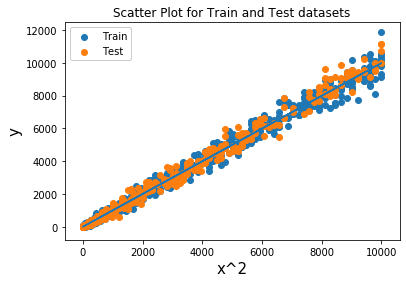

In [70]:
plt.scatter(dt3b['x']**2,dt3b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x^2", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter(dt3t['x']**2,dt3t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

plt.plot(dt3b['x']**2, (15.65306579333992 + 0.99576881*dt3b['x']**2))

In [74]:
y_pred_b3 = reg.predict(x_train3)
residual3 = y_train3 - y_pred_b3

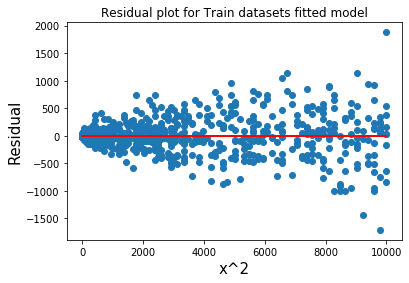

In [76]:
plt.scatter(dt3b['x']**2,residual3)
plt.title("Residual plot for Train datasets fitted model")
plt.xlabel("x^2", fontsize=15)
plt.ylabel("Residual", fontsize=15)
plt.plot(dt3b['x']**2, 0*dt3b['x'], color="r")

# Practice 4 - Can you implement simple linear regression model in practice1 from scratch using gradient descent?
# This is your homework

In [77]:
print("Train data size: {}".format(dt1b.shape))
print("Test data size: {}".format(dt1t.shape))

Train data size: (699, 2)
Test data size: (300, 2)


In [78]:
x_train = dt1b['x']
y_train = dt1b['y']
x_test = dt1t['x']
y_test = dt1t['y']

x_train = np.array(x_train).reshape(699,1)
y_train = np.array(y_train).reshape(699,1)
x_test = np.array(x_test).reshape(300,1)
y_test = np.array(y_test).reshape(300,1)

### Train steps:
#### 0 - Initiate parameters
#### 1 - Calculate prediction based on temp parameters and equation 
#### 2 - Calc. cost
#### 3 - Calc. Gradient
#### 4 - Update Parameter
#### 5 - loop 1-4 to reach min cost
#### 6 - earlier stop to end loop if minimal alrrady reached

### Bilding block functions (Only put two you need to finish the rest)

In [90]:
def get_pred(x_train, parameters):
    b1 = parameters['b1'] #coefficient
    b0 = parameters['b0'] #intercept
    predictions = np.multiply(b1, x_train) + b0
    return predictions

def cost_function(predictions, y_train):
    cost = np.mean((y_train - predictions) ** 2) * 0.5 #*0.5-->to scale down
    return cost

def deriv(x_train, y_train, predictions):
    derivatives = dict()
    derivatives["b1"] = -2*np.mean(x_train*(y_train-predictions))
    derivatives["b0"] = -2*np.mean(y_train-predictions)
    return derivatives

def update_parameters(parameters, derivatives, learning_rate):
    parameters['b1'] -= learning_rate*derivatives['b1']
    parameters['b0'] -= learning_rate*derivatives['b0']
    return parameters

### Build training function

In [108]:
def train(x_train, y_train, learning_rate, iters = 5):
    #random parameters
    parameters = dict()
    parameters["b1"] = np.random.uniform(0,1) * -1
    parameters["b0"] = np.random.uniform(0,1) * -1
    
    plt.figure()
    
    #loss
    loss = list()
    
    #iterate
    for i in range(iters):
        
        #Prediction
        predictions = get_pred(x_train, parameters)
        
        #cost function
        cost = cost_function(predictions, y_train)
        
        #append loss and print
        loss.append(cost)
        print("Iteration = {}, Loss = {}".format(i+1, cost))
        
        #plot function
        plt.plot(x_train, y_train, 'x')
        plt.plot(x_train, predictions, 'o')
        plt.show()
        
        #Calc. gradient/derivatives
        derivatives = deriv(x_train, y_train, predictions)
        
        #update parameters
        parameters = update_parameters(parameters, derivatives, learning_rate)
                
    return parameters, loss

### Traing model with your function by gradient descent algrithm

Iteration = 1, Loss = 3648.0993661025263


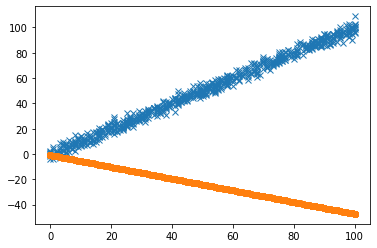

Iteration = 2, Loss = 406.00860199856714


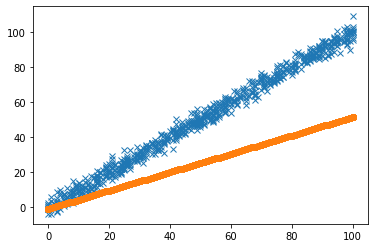

Iteration = 3, Loss = 48.37130585192266


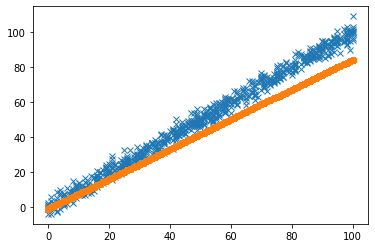

Iteration = 4, Loss = 8.920078455606271


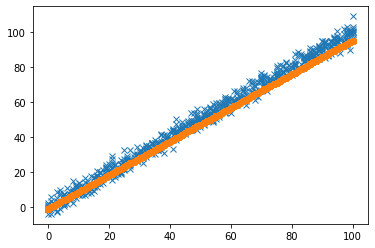

Iteration = 5, Loss = 4.568177664360941


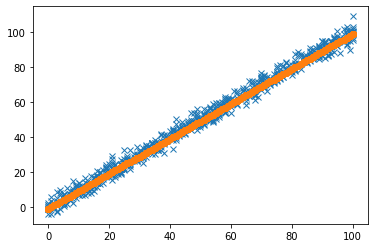

Iteration = 6, Loss = 4.088108010185418


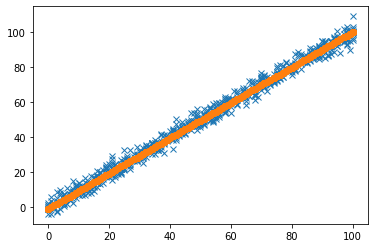

Iteration = 7, Loss = 4.035142743199985


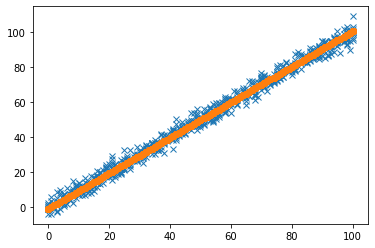

Iteration = 8, Loss = 4.029291659147054


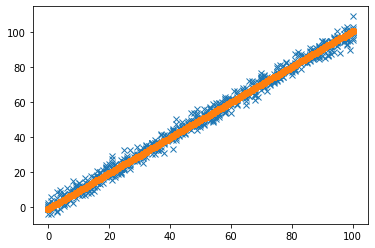

Iteration = 9, Loss = 4.028637774237692


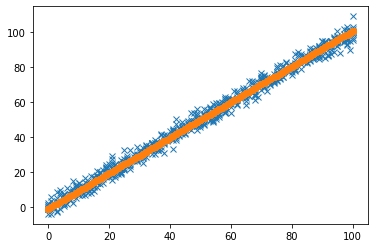

Iteration = 10, Loss = 4.028557196828636


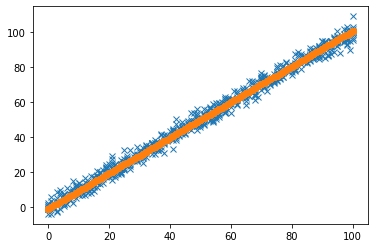

Iteration = 11, Loss = 4.02853986221581


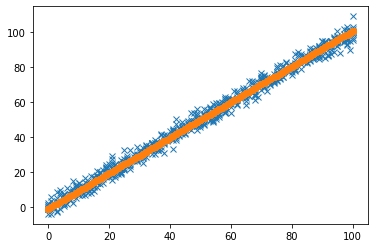

Iteration = 12, Loss = 4.028529504806779


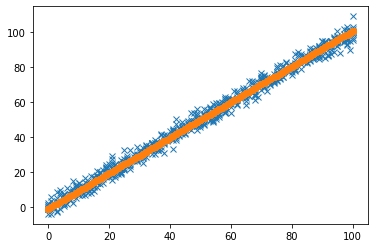

Iteration = 13, Loss = 4.028519917904809


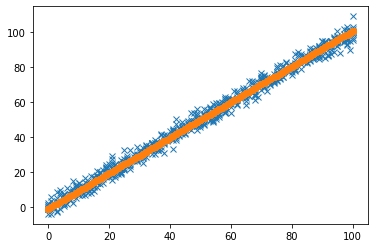

Iteration = 14, Loss = 4.028510416844783


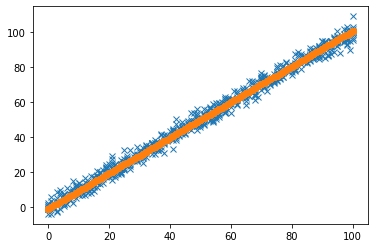

Iteration = 15, Loss = 4.028500926100729


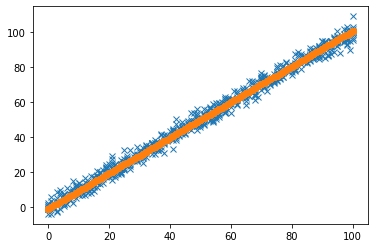

Iteration = 16, Loss = 4.02849143734124


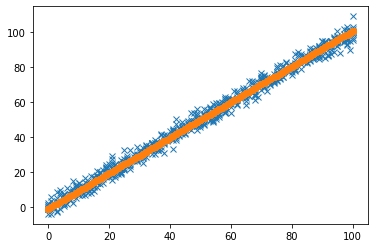

Iteration = 17, Loss = 4.028481949647187


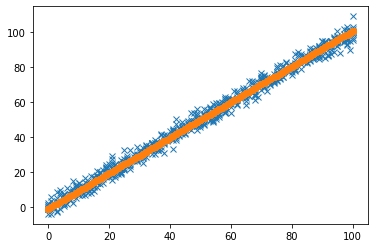

Iteration = 18, Loss = 4.0284724629170965


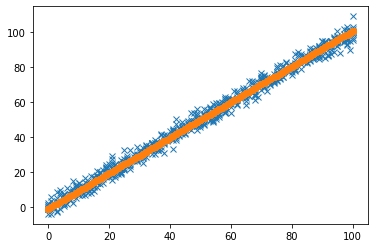

Iteration = 19, Loss = 4.028462977139691


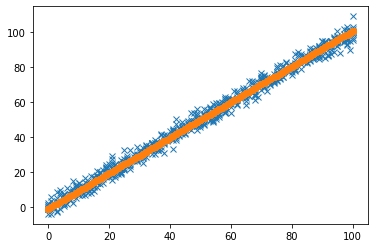

Iteration = 20, Loss = 4.028453492313639


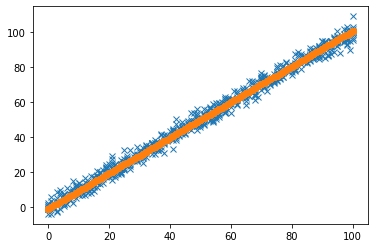

Iteration = 21, Loss = 4.0284440084387105


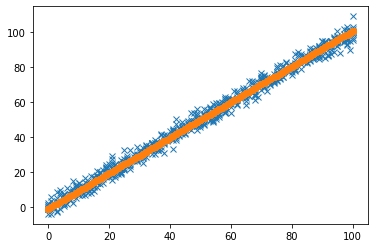

Iteration = 22, Loss = 4.028434525514796


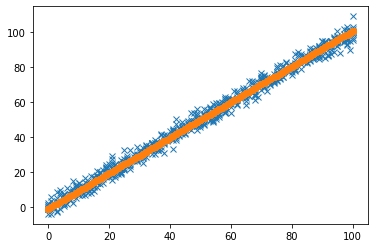

Iteration = 23, Loss = 4.028425043541797


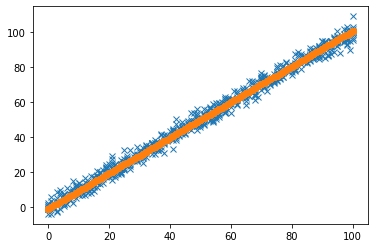

Iteration = 24, Loss = 4.028415562519616


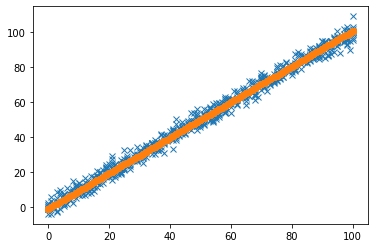

Iteration = 25, Loss = 4.028406082448162


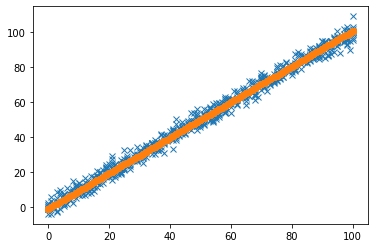

Iteration = 26, Loss = 4.028396603327338


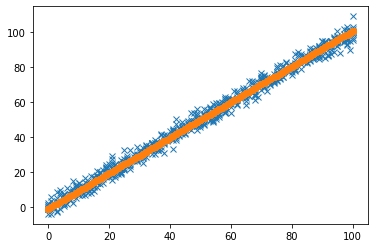

Iteration = 27, Loss = 4.028387125157047


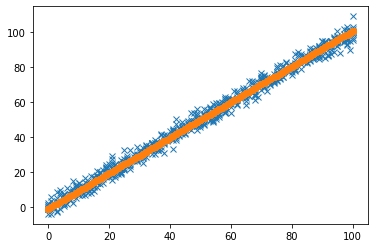

Iteration = 28, Loss = 4.0283776479371936


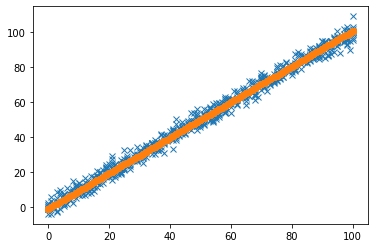

Iteration = 29, Loss = 4.028368171667687


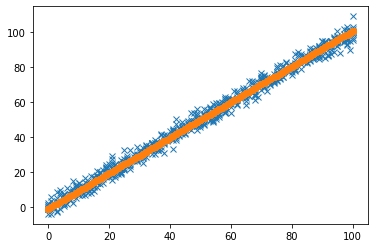

Iteration = 30, Loss = 4.028358696348428


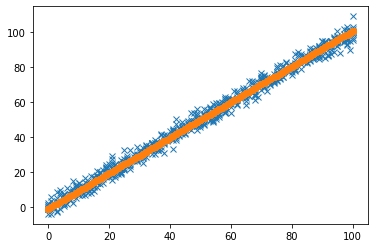

Iteration = 31, Loss = 4.028349221979319


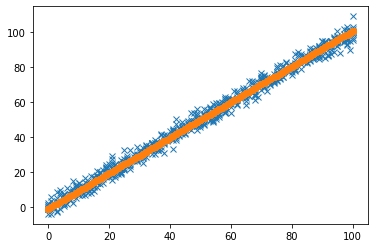

Iteration = 32, Loss = 4.0283397485602706


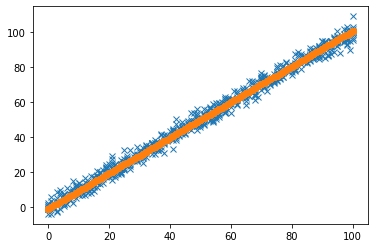

Iteration = 33, Loss = 4.028330276091184


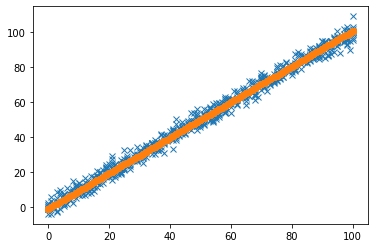

Iteration = 34, Loss = 4.028320804571965


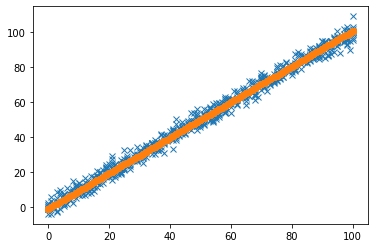

Iteration = 35, Loss = 4.0283113340025185


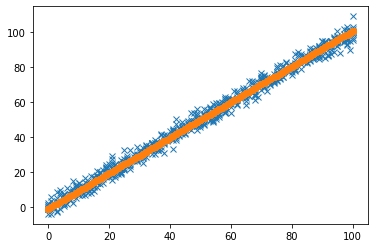

Iteration = 36, Loss = 4.0283018643827475


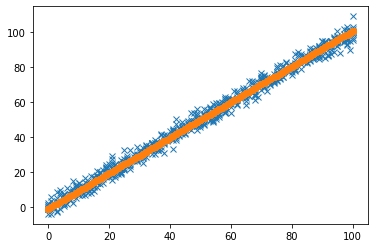

Iteration = 37, Loss = 4.028292395712558


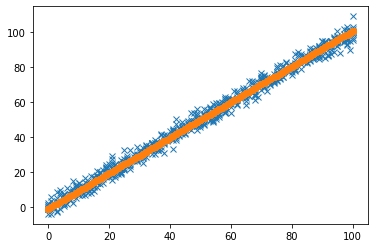

Iteration = 38, Loss = 4.028282927991856


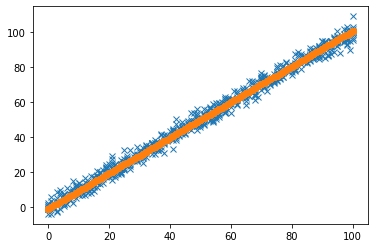

Iteration = 39, Loss = 4.028273461220543


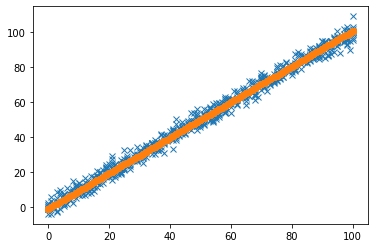

Iteration = 40, Loss = 4.028263995398529


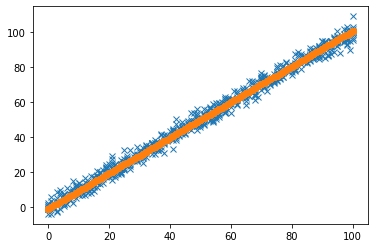

Iteration = 41, Loss = 4.028254530525712


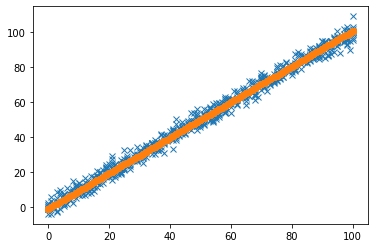

Iteration = 42, Loss = 4.028245066602003


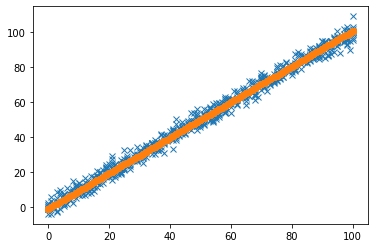

Iteration = 43, Loss = 4.028235603627304


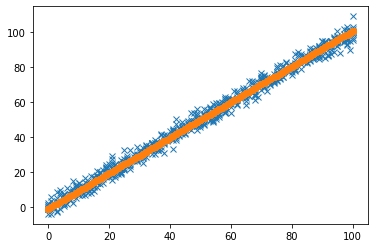

Iteration = 44, Loss = 4.02822614160152


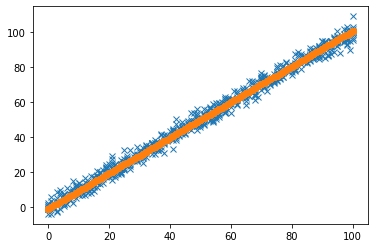

Iteration = 45, Loss = 4.028216680524555


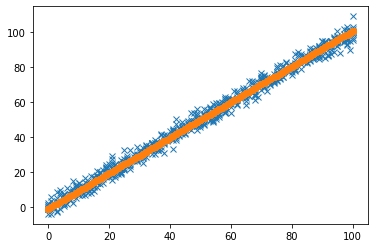

Iteration = 46, Loss = 4.028207220396316


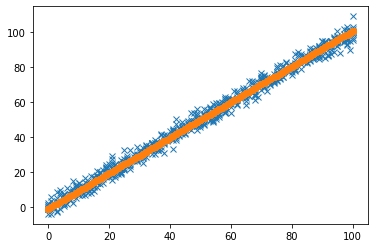

Iteration = 47, Loss = 4.028197761216707


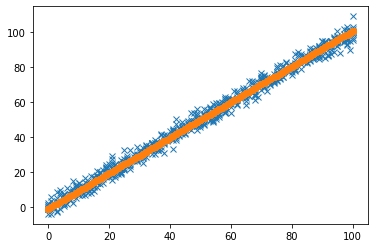

Iteration = 48, Loss = 4.028188302985632


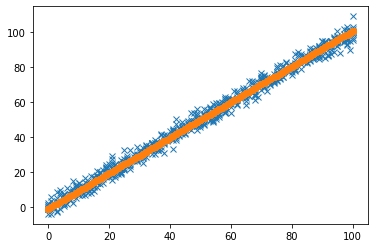

Iteration = 49, Loss = 4.028178845702996


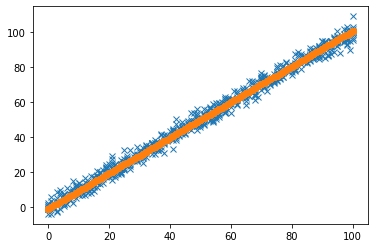

Iteration = 50, Loss = 4.0281693893687045


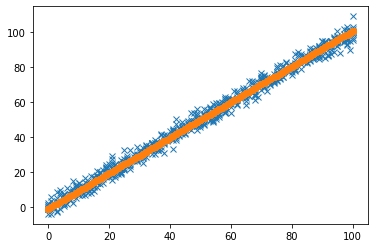

Iteration = 51, Loss = 4.028159933982662


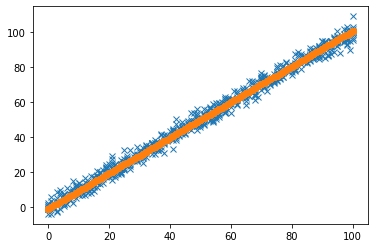

Iteration = 52, Loss = 4.028150479544775


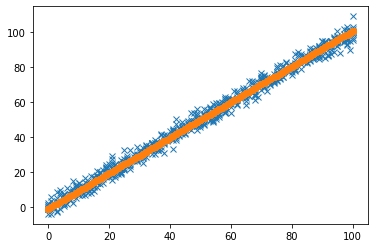

Iteration = 53, Loss = 4.028141026054946


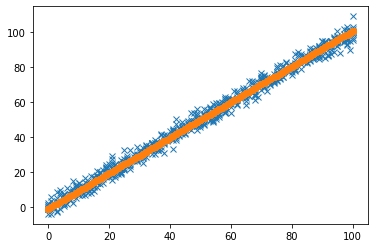

Iteration = 54, Loss = 4.0281315735130825


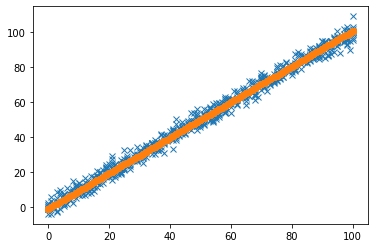

Iteration = 55, Loss = 4.028122121919087


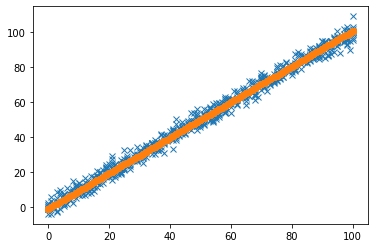

Iteration = 56, Loss = 4.028112671272865


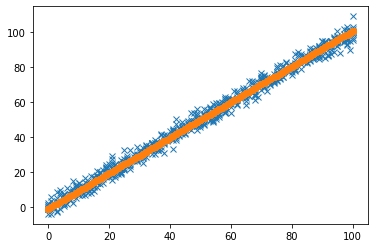

Iteration = 57, Loss = 4.028103221574321


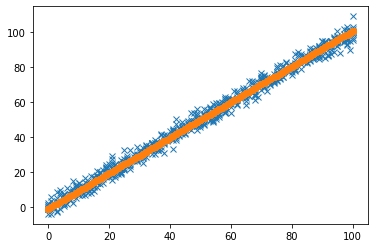

Iteration = 58, Loss = 4.028093772823363


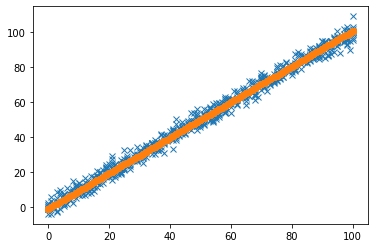

Iteration = 59, Loss = 4.028084325019893


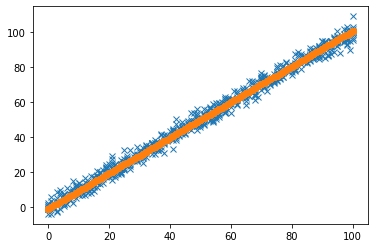

Iteration = 60, Loss = 4.028074878163817


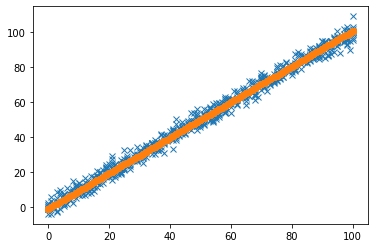

Iteration = 61, Loss = 4.028065432255041


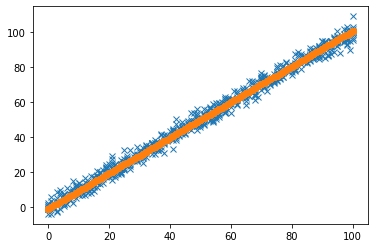

Iteration = 62, Loss = 4.028055987293467


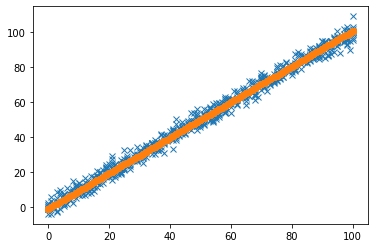

Iteration = 63, Loss = 4.028046543279002


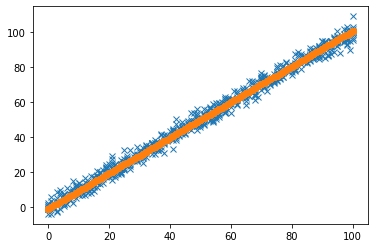

Iteration = 64, Loss = 4.028037100211552


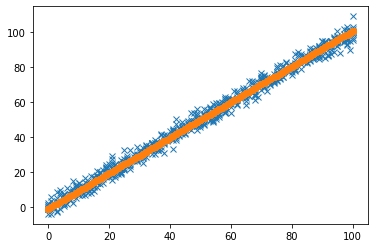

Iteration = 65, Loss = 4.0280276580910215


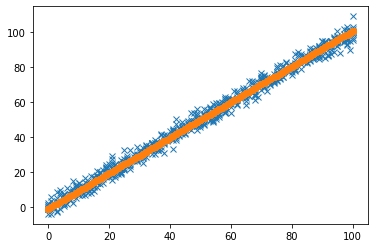

Iteration = 66, Loss = 4.028018216917315


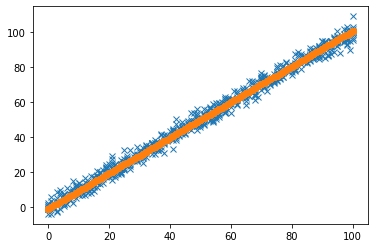

Iteration = 67, Loss = 4.028008776690334


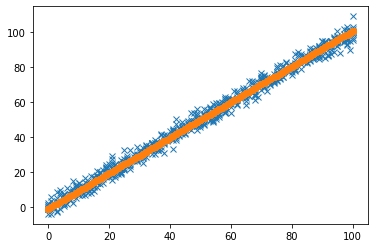

Iteration = 68, Loss = 4.027999337409988


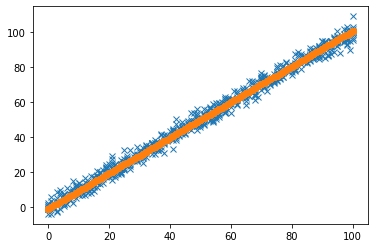

Iteration = 69, Loss = 4.027989899076184


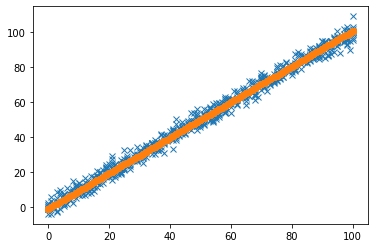

Iteration = 70, Loss = 4.0279804616888235


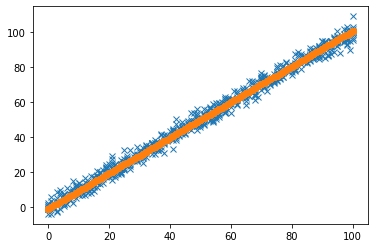

Iteration = 71, Loss = 4.027971025247811


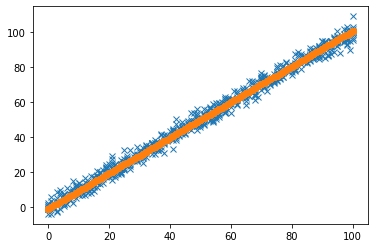

Iteration = 72, Loss = 4.027961589753053


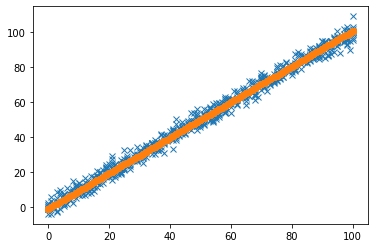

Iteration = 73, Loss = 4.0279521552044555


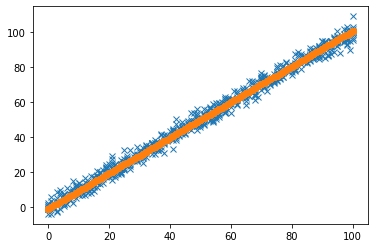

Iteration = 74, Loss = 4.0279427216019235


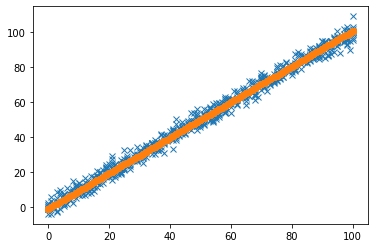

Iteration = 75, Loss = 4.027933288945359


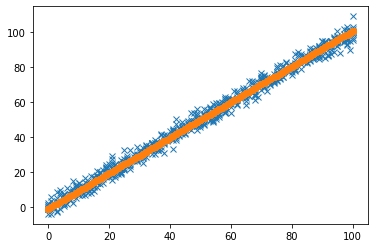

Iteration = 76, Loss = 4.027923857234671


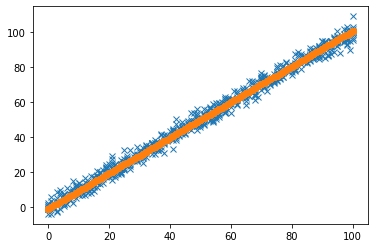

Iteration = 77, Loss = 4.0279144264697635


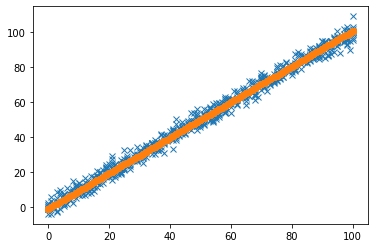

Iteration = 78, Loss = 4.027904996650541


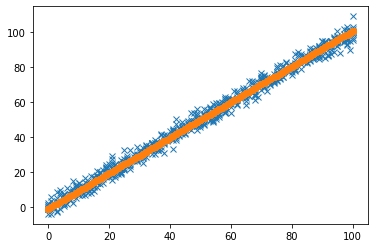

Iteration = 79, Loss = 4.027895567776907


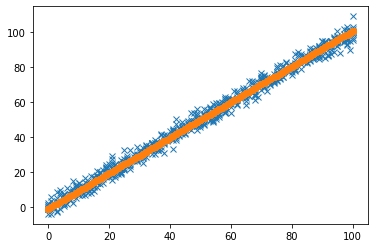

Iteration = 80, Loss = 4.027886139848771


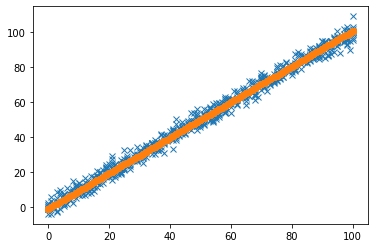

Iteration = 81, Loss = 4.027876712866035


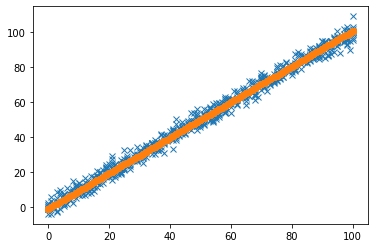

Iteration = 82, Loss = 4.027867286828606


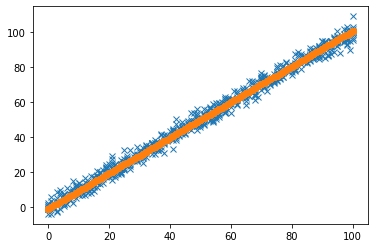

Iteration = 83, Loss = 4.027857861736386


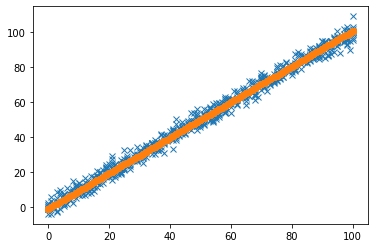

Iteration = 84, Loss = 4.0278484375892845


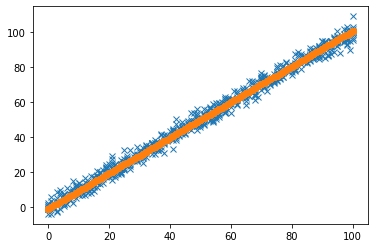

Iteration = 85, Loss = 4.027839014387204


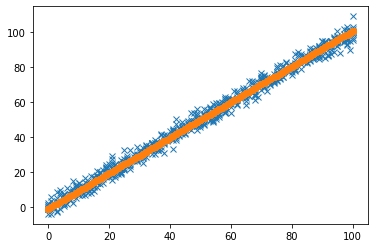

Iteration = 86, Loss = 4.027829592130049


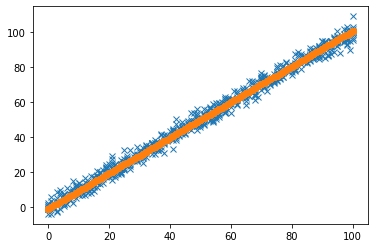

Iteration = 87, Loss = 4.027820170817728


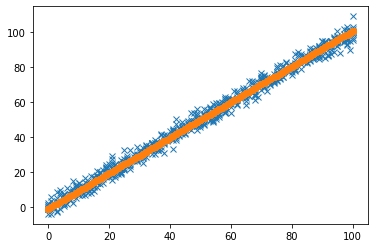

Iteration = 88, Loss = 4.027810750450143


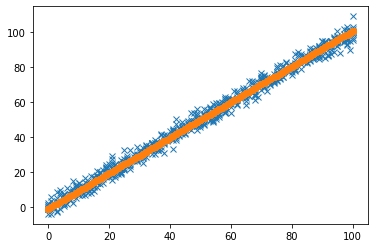

Iteration = 89, Loss = 4.027801331027201


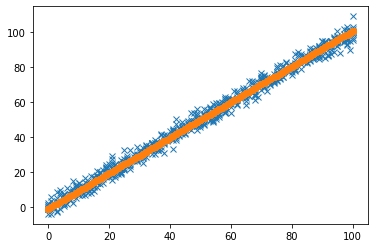

Iteration = 90, Loss = 4.0277919125488095


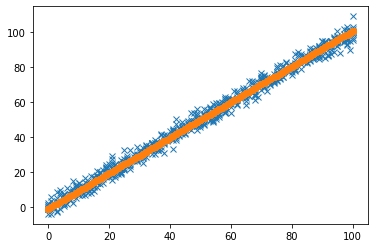

Iteration = 91, Loss = 4.027782495014869


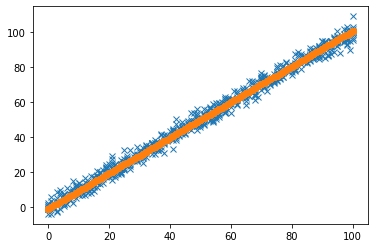

Iteration = 92, Loss = 4.027773078425287


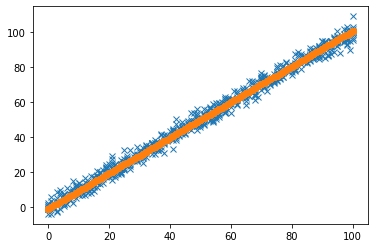

Iteration = 93, Loss = 4.027763662779966


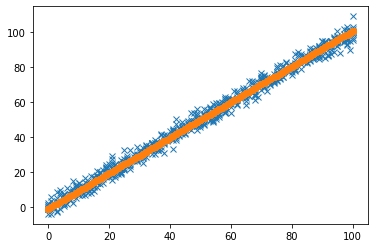

Iteration = 94, Loss = 4.027754248078818


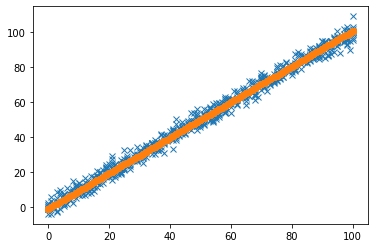

Iteration = 95, Loss = 4.027744834321743


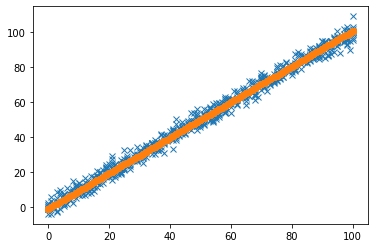

Iteration = 96, Loss = 4.027735421508649


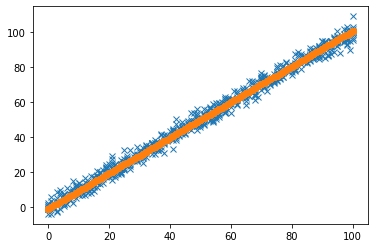

Iteration = 97, Loss = 4.02772600963944


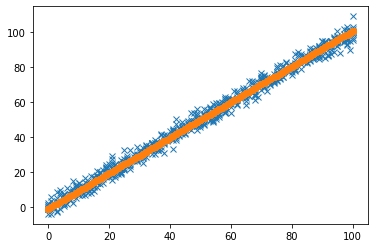

Iteration = 98, Loss = 4.02771659871402


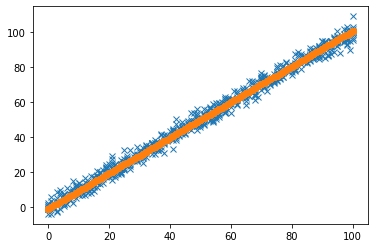

Iteration = 99, Loss = 4.027707188732297


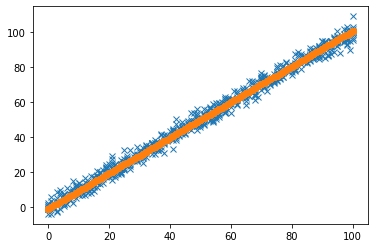

Iteration = 100, Loss = 4.027697779694175


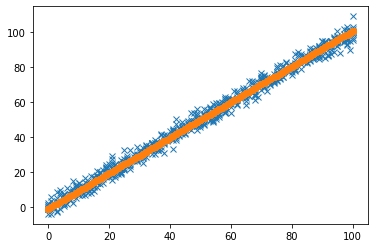

Iteration = 101, Loss = 4.02768837159956


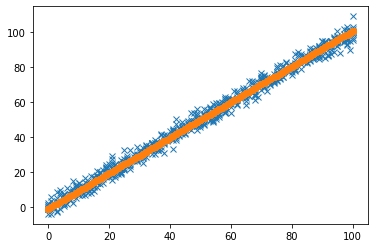

Iteration = 102, Loss = 4.027678964448356


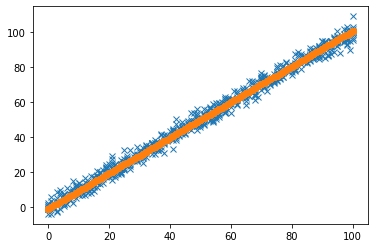

Iteration = 103, Loss = 4.02766955824047


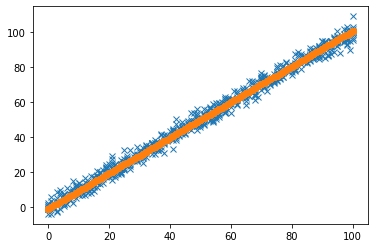

Iteration = 104, Loss = 4.027660152975807


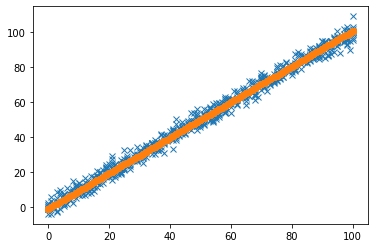

Iteration = 105, Loss = 4.027650748654272


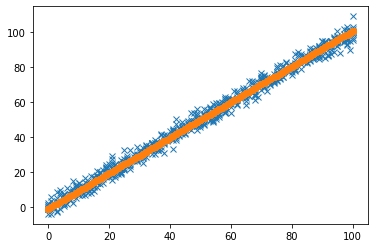

Iteration = 106, Loss = 4.02764134527577


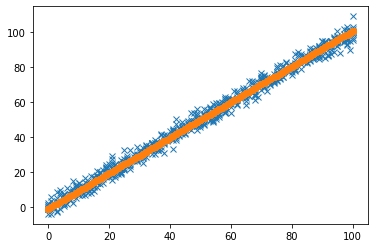

Iteration = 107, Loss = 4.027631942840207


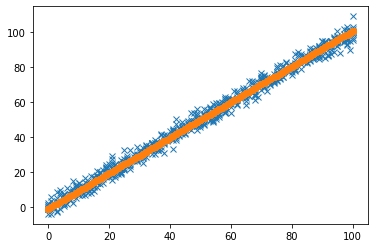

Iteration = 108, Loss = 4.02762254134749


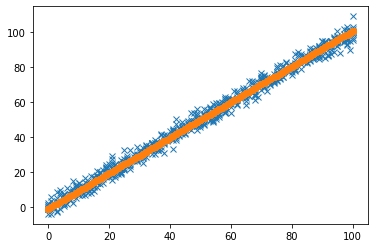

Iteration = 109, Loss = 4.027613140797521


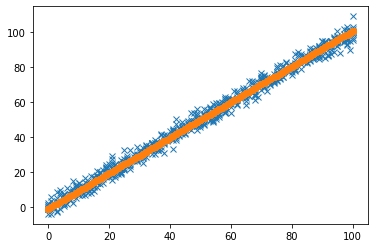

Iteration = 110, Loss = 4.027603741190209


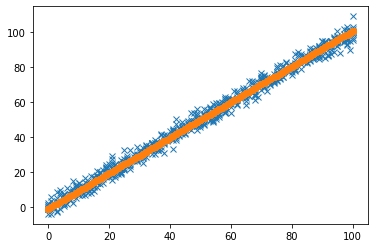

Iteration = 111, Loss = 4.027594342525458


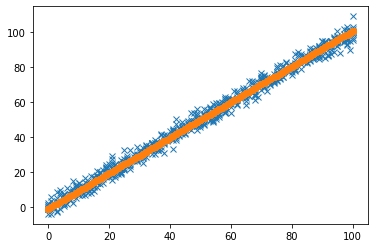

Iteration = 112, Loss = 4.027584944803173


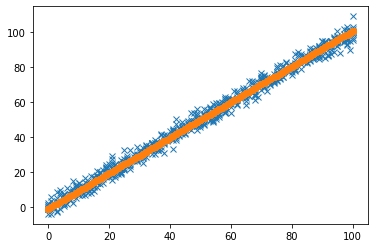

Iteration = 113, Loss = 4.027575548023259


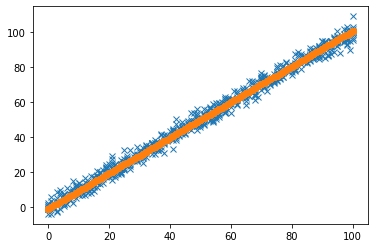

Iteration = 114, Loss = 4.0275661521856225


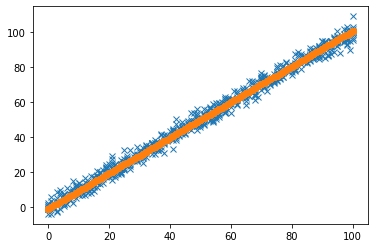

Iteration = 115, Loss = 4.027556757290168


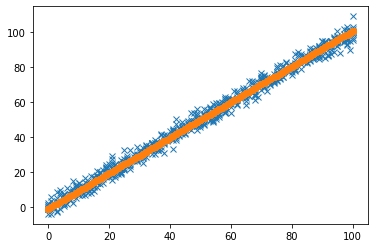

Iteration = 116, Loss = 4.027547363336805


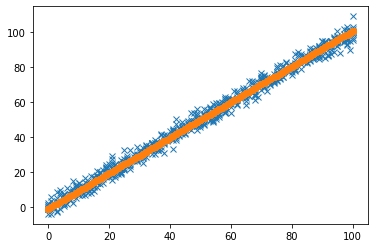

Iteration = 117, Loss = 4.027537970325435


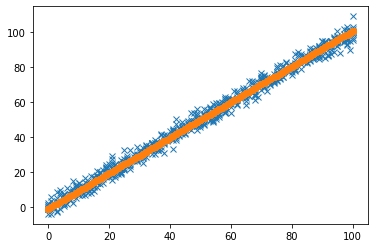

Iteration = 118, Loss = 4.027528578255962


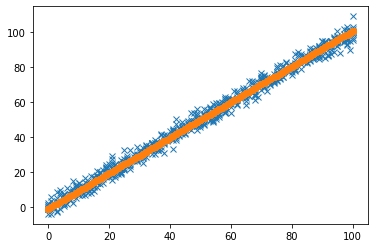

Iteration = 119, Loss = 4.027519187128295


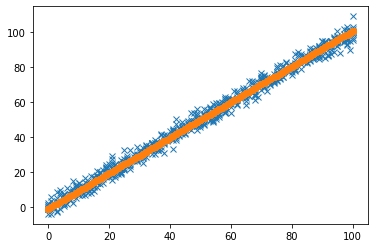

Iteration = 120, Loss = 4.02750979694234


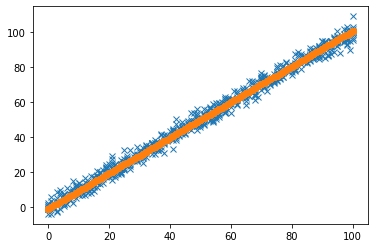

Iteration = 121, Loss = 4.027500407697999


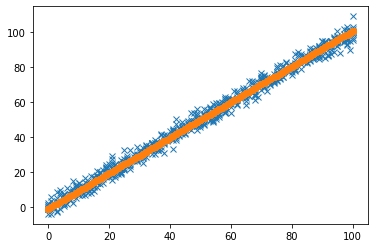

Iteration = 122, Loss = 4.027491019395183


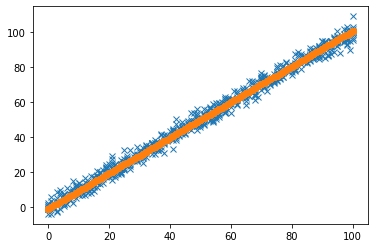

Iteration = 123, Loss = 4.027481632033791


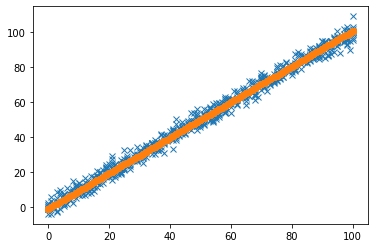

Iteration = 124, Loss = 4.027472245613734


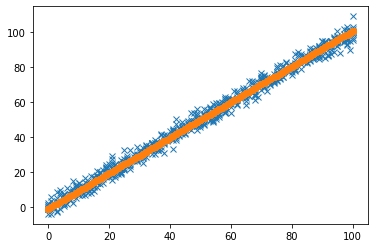

Iteration = 125, Loss = 4.027462860134915


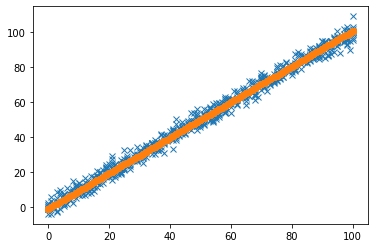

Iteration = 126, Loss = 4.02745347559724


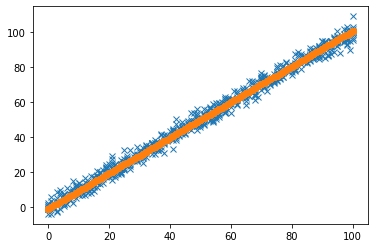

Iteration = 127, Loss = 4.027444092000615


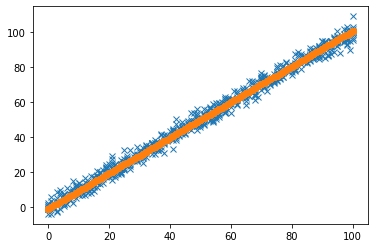

Iteration = 128, Loss = 4.027434709344945


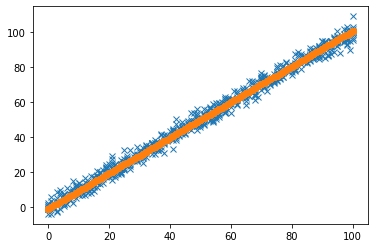

Iteration = 129, Loss = 4.027425327630135


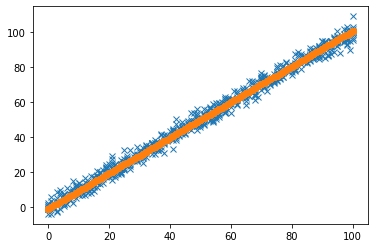

Iteration = 130, Loss = 4.0274159468560935


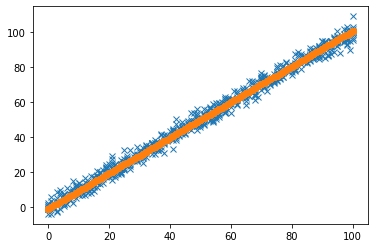

Iteration = 131, Loss = 4.027406567022725


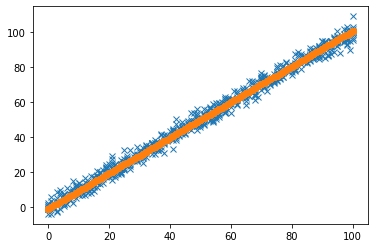

Iteration = 132, Loss = 4.027397188129933


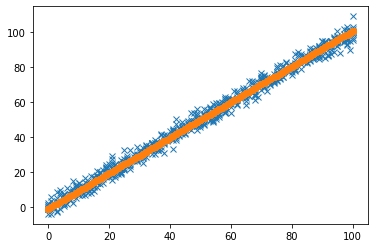

Iteration = 133, Loss = 4.027387810177624


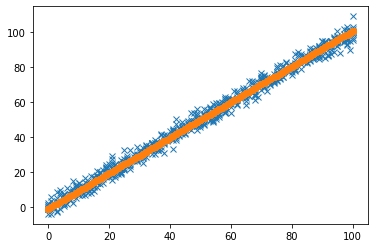

Iteration = 134, Loss = 4.027378433165706


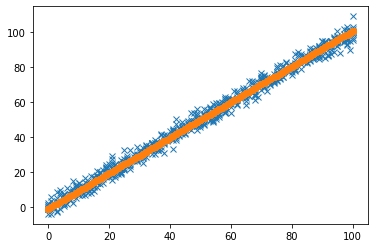

Iteration = 135, Loss = 4.027369057094082


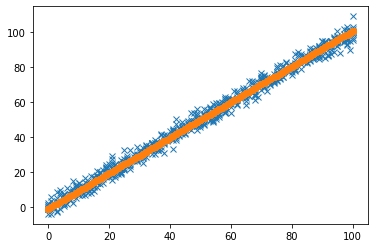

Iteration = 136, Loss = 4.027359681962659


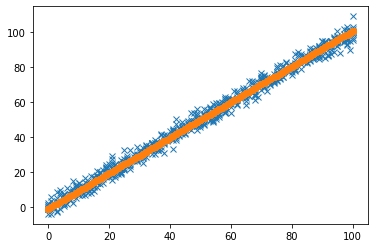

Iteration = 137, Loss = 4.027350307771343


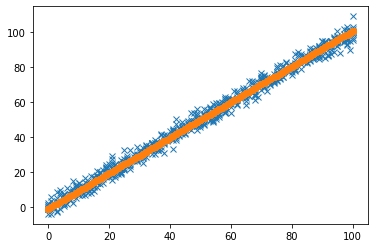

Iteration = 138, Loss = 4.027340934520041


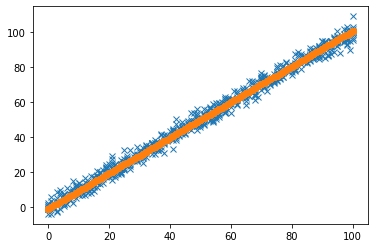

Iteration = 139, Loss = 4.027331562208655


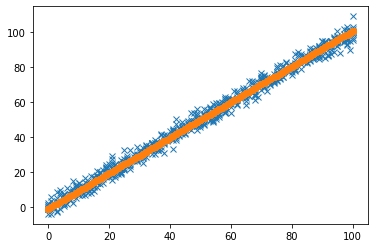

Iteration = 140, Loss = 4.027322190837093


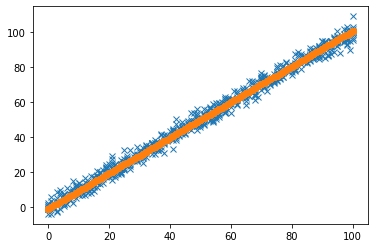

Iteration = 141, Loss = 4.02731282040526


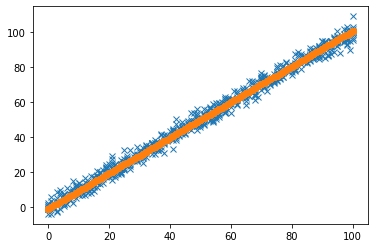

Iteration = 142, Loss = 4.027303450913062


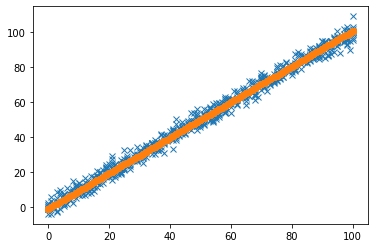

Iteration = 143, Loss = 4.027294082360406


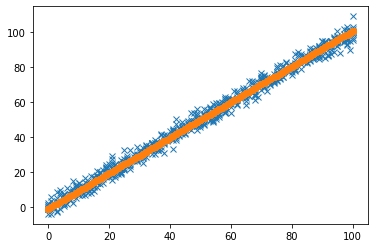

Iteration = 144, Loss = 4.0272847147471955


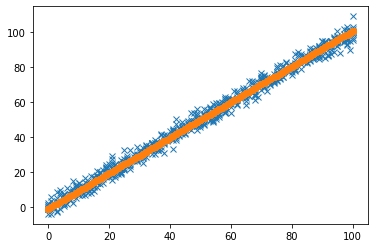

Iteration = 145, Loss = 4.027275348073339


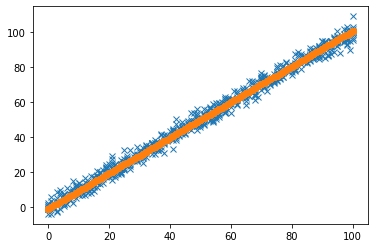

Iteration = 146, Loss = 4.027265982338741


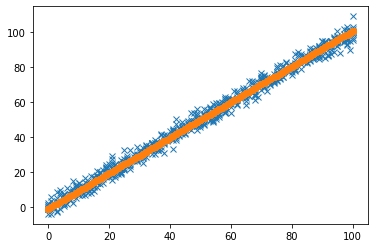

Iteration = 147, Loss = 4.027256617543307


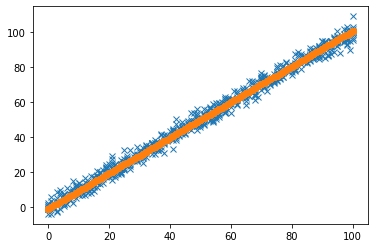

Iteration = 148, Loss = 4.027247253686942


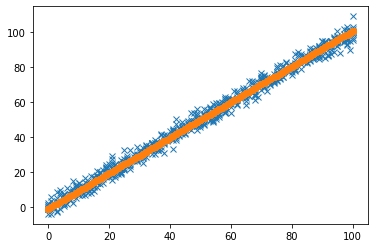

Iteration = 149, Loss = 4.0272378907695545


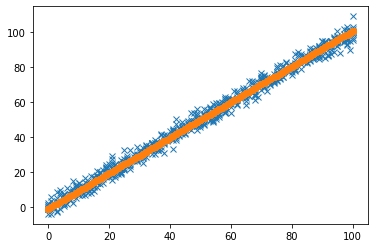

Iteration = 150, Loss = 4.0272285287910465


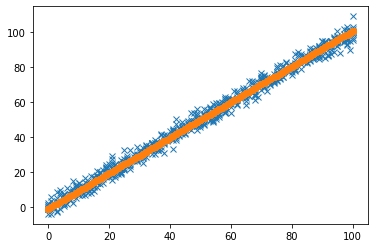

Iteration = 151, Loss = 4.02721916775133


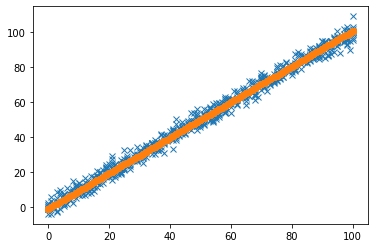

Iteration = 152, Loss = 4.027209807650305


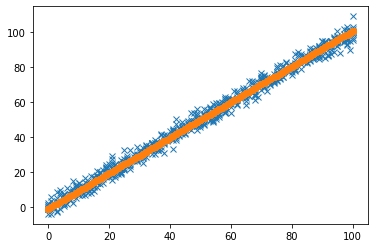

Iteration = 153, Loss = 4.0272004484878785


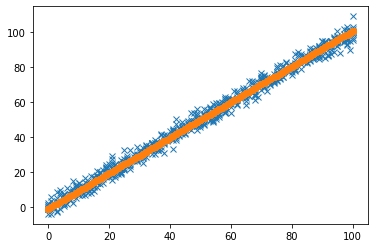

Iteration = 154, Loss = 4.027191090263957


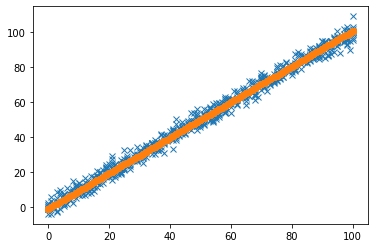

Iteration = 155, Loss = 4.027181732978447


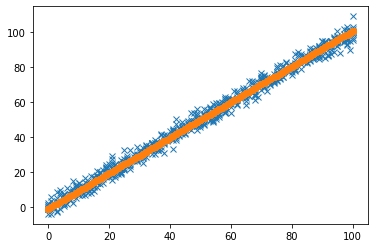

Iteration = 156, Loss = 4.027172376631254


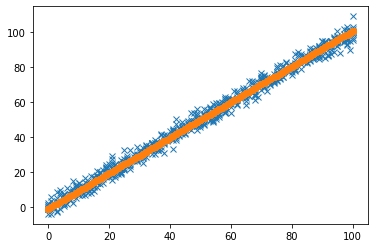

Iteration = 157, Loss = 4.027163021222285


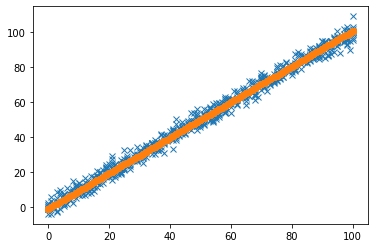

Iteration = 158, Loss = 4.027153666751444


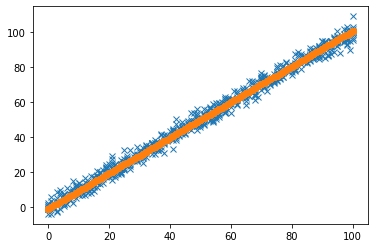

Iteration = 159, Loss = 4.027144313218638


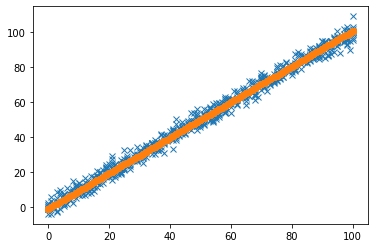

Iteration = 160, Loss = 4.027134960623773


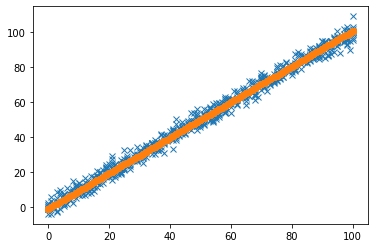

Iteration = 161, Loss = 4.027125608966754


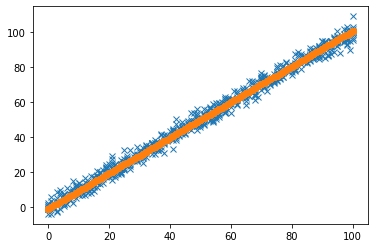

Iteration = 162, Loss = 4.027116258247488


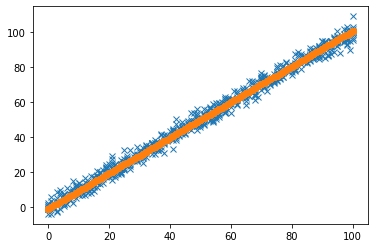

Iteration = 163, Loss = 4.027106908465879


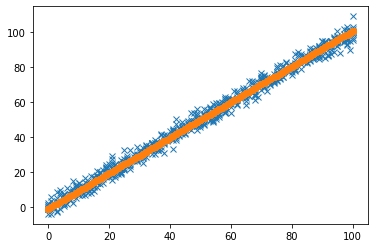

Iteration = 164, Loss = 4.027097559621836


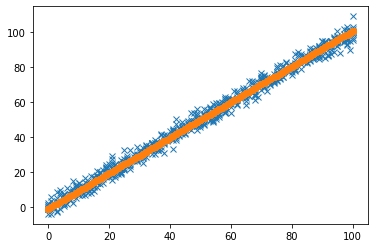

Iteration = 165, Loss = 4.027088211715264


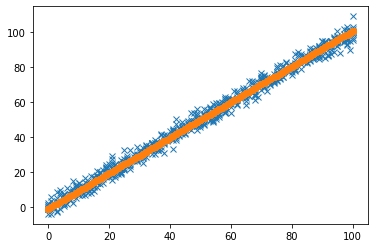

Iteration = 166, Loss = 4.027078864746069


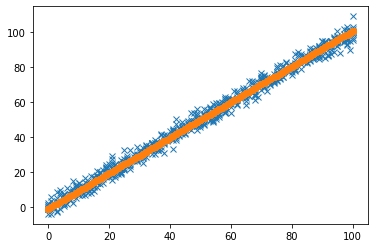

Iteration = 167, Loss = 4.027069518714155


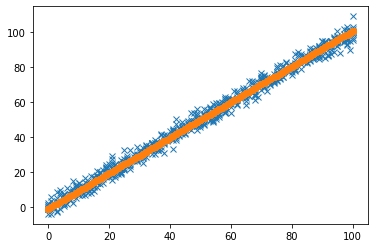

Iteration = 168, Loss = 4.02706017361943


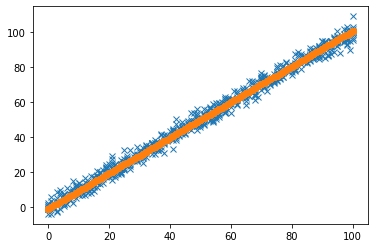

Iteration = 169, Loss = 4.0270508294618


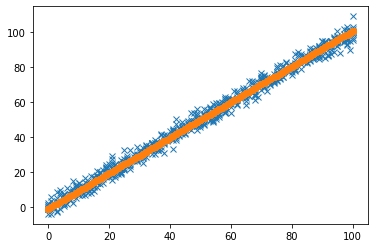

Iteration = 170, Loss = 4.027041486241169


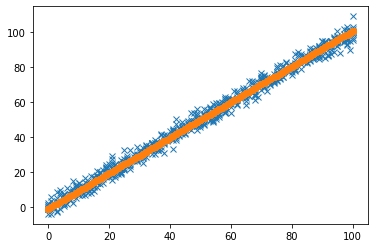

Iteration = 171, Loss = 4.027032143957446


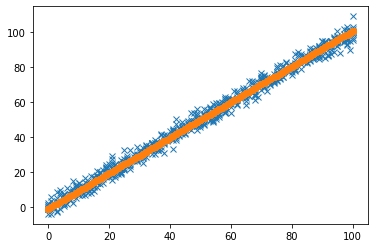

Iteration = 172, Loss = 4.027022802610535


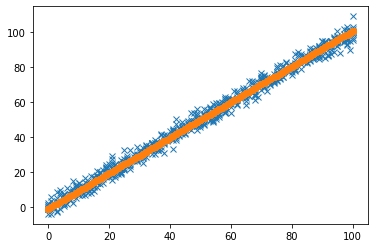

Iteration = 173, Loss = 4.027013462200342


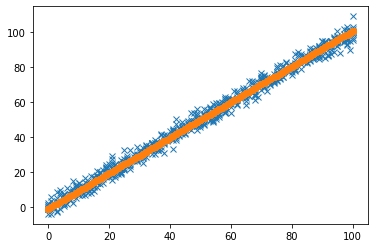

Iteration = 174, Loss = 4.027004122726778


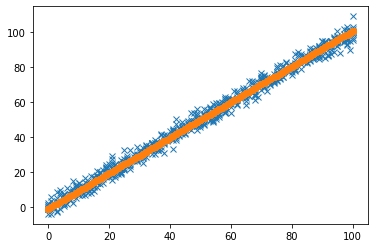

Iteration = 175, Loss = 4.026994784189741


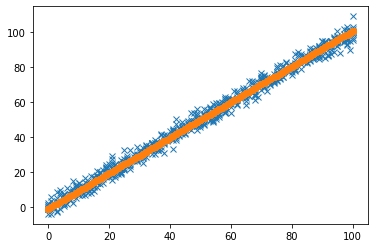

Iteration = 176, Loss = 4.026985446589142


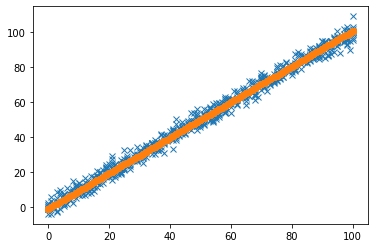

Iteration = 177, Loss = 4.0269761099248855


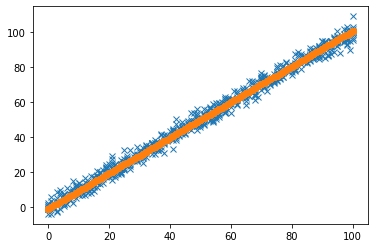

Iteration = 178, Loss = 4.026966774196878


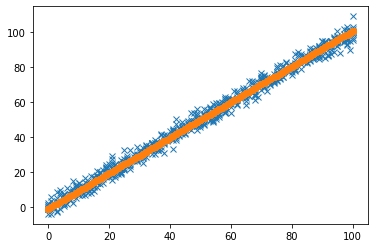

Iteration = 179, Loss = 4.026957439405027


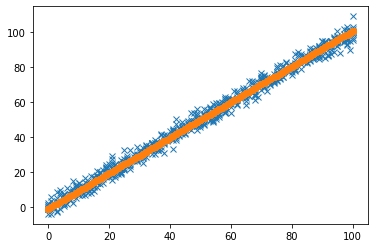

Iteration = 180, Loss = 4.026948105549236


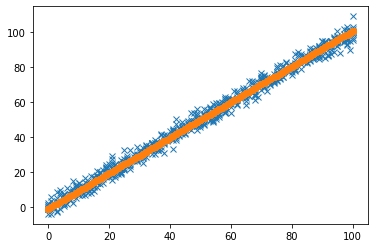

Iteration = 181, Loss = 4.026938772629414


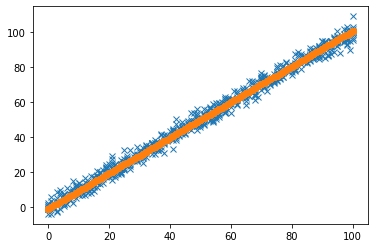

Iteration = 182, Loss = 4.026929440645466


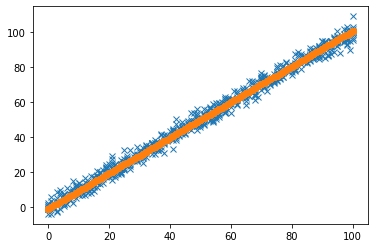

Iteration = 183, Loss = 4.026920109597296


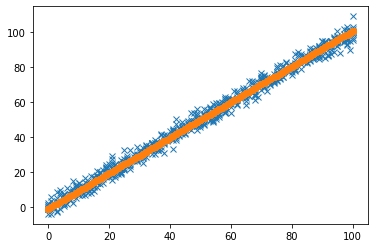

Iteration = 184, Loss = 4.026910779484814


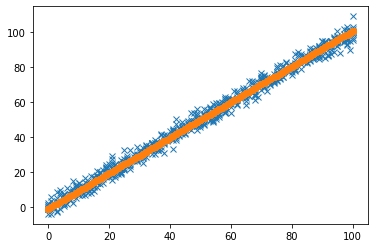

Iteration = 185, Loss = 4.026901450307921


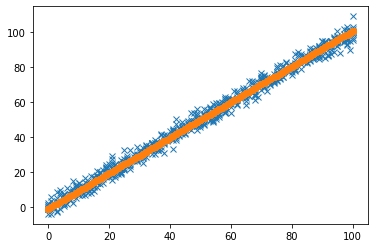

Iteration = 186, Loss = 4.026892122066531


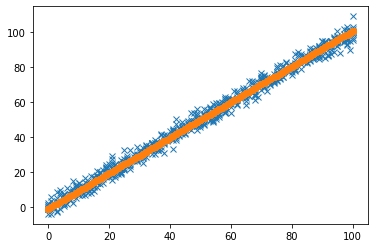

Iteration = 187, Loss = 4.0268827947605415


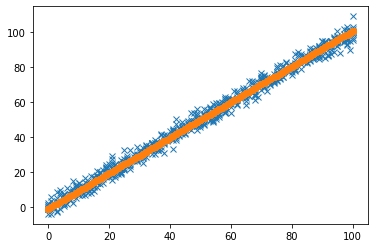

Iteration = 188, Loss = 4.026873468389864


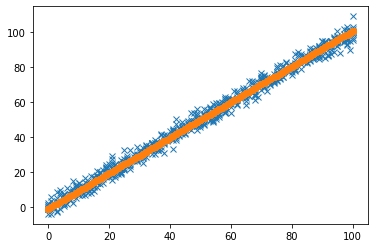

Iteration = 189, Loss = 4.0268641429544045


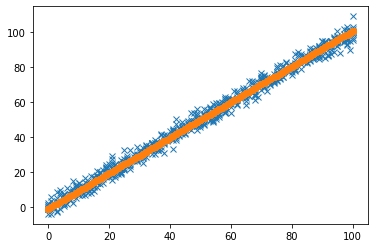

Iteration = 190, Loss = 4.026854818454068


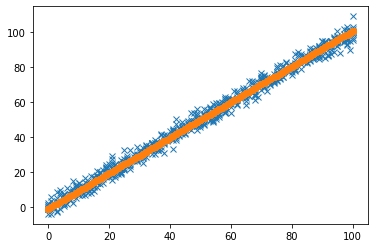

Iteration = 191, Loss = 4.02684549488876


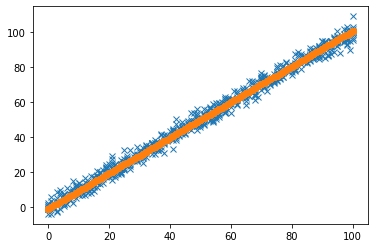

Iteration = 192, Loss = 4.026836172258388


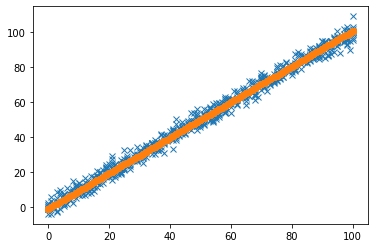

Iteration = 193, Loss = 4.026826850562858


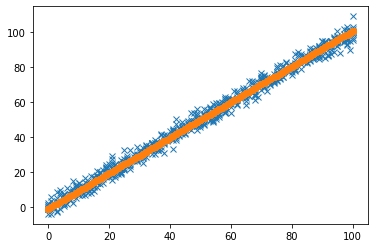

Iteration = 194, Loss = 4.026817529802077


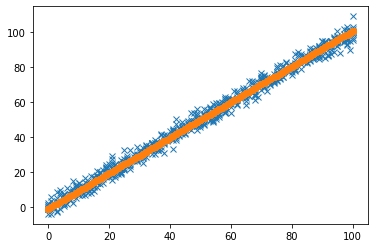

Iteration = 195, Loss = 4.026808209975949


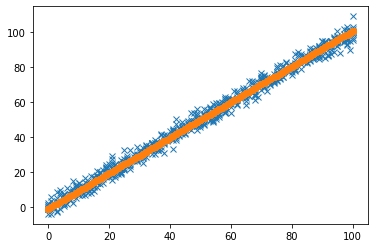

Iteration = 196, Loss = 4.026798891084383


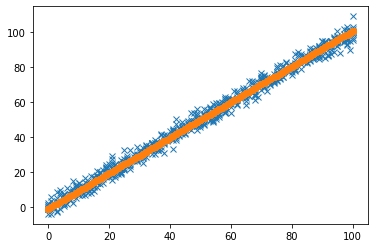

Iteration = 197, Loss = 4.026789573127283


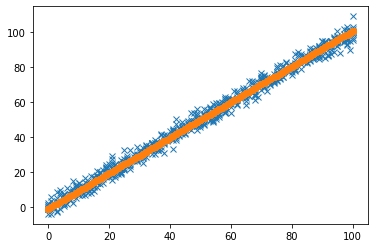

Iteration = 198, Loss = 4.026780256104556


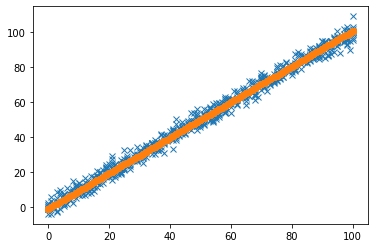

Iteration = 199, Loss = 4.026770940016109


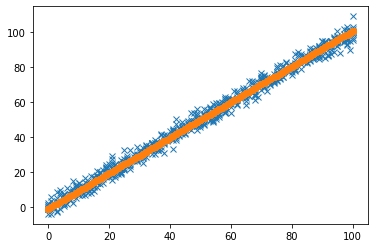

Iteration = 200, Loss = 4.026761624861848


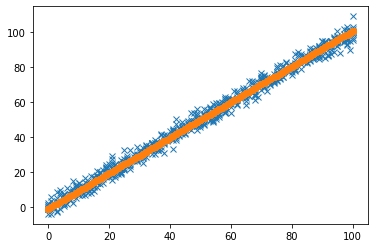

Iteration = 201, Loss = 4.02675231064168


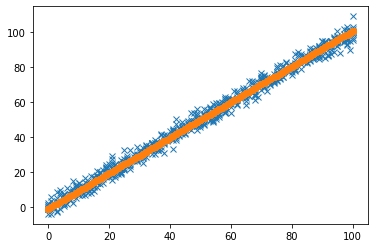

Iteration = 202, Loss = 4.02674299735551


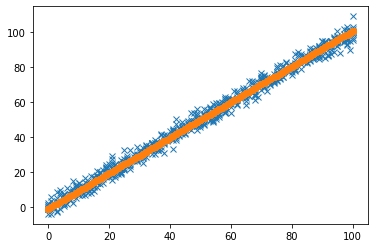

Iteration = 203, Loss = 4.026733685003244


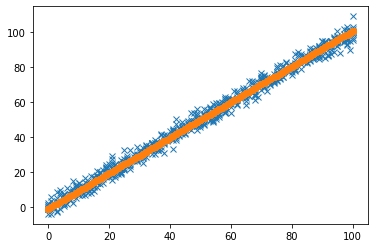

Iteration = 204, Loss = 4.026724373584791


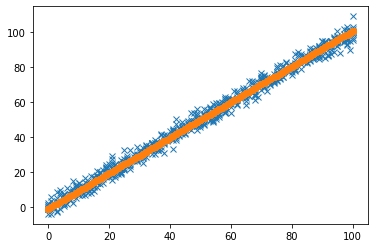

Iteration = 205, Loss = 4.026715063100054


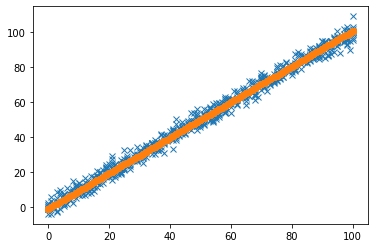

Iteration = 206, Loss = 4.026705753548941


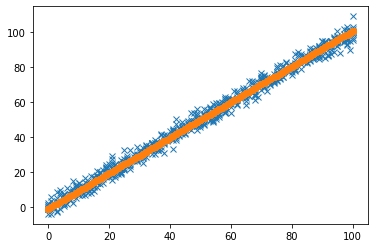

Iteration = 207, Loss = 4.02669644493136


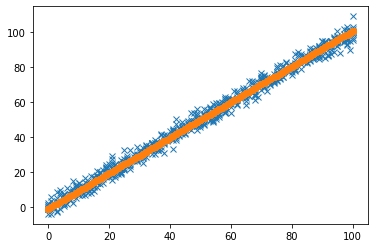

Iteration = 208, Loss = 4.0266871372472135


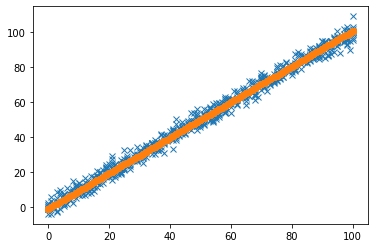

Iteration = 209, Loss = 4.026677830496412


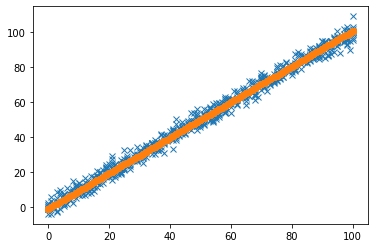

Iteration = 210, Loss = 4.02666852467886


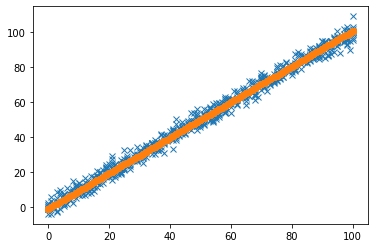

Iteration = 211, Loss = 4.026659219794463


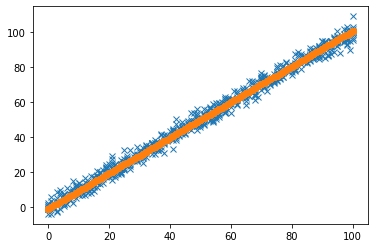

Iteration = 212, Loss = 4.026649915843129


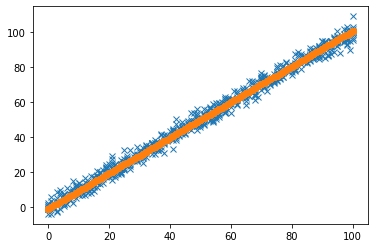

Iteration = 213, Loss = 4.026640612824762


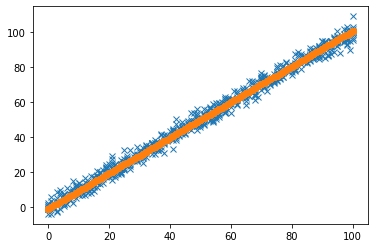

Iteration = 214, Loss = 4.0266313107392735


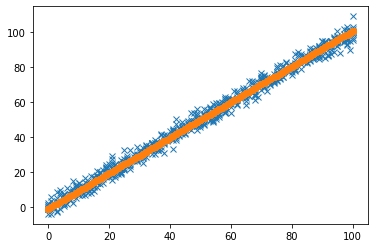

Iteration = 215, Loss = 4.026622009586564


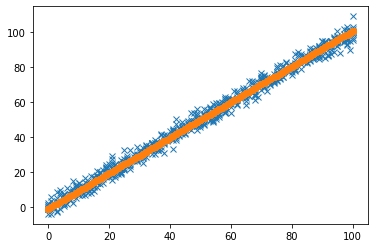

Iteration = 216, Loss = 4.026612709366545


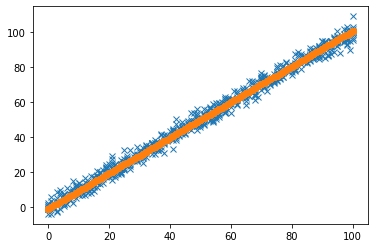

Iteration = 217, Loss = 4.026603410079119


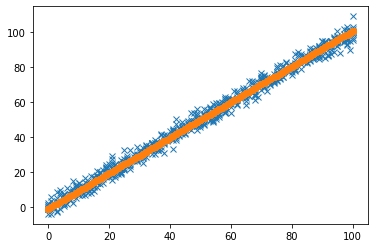

Iteration = 218, Loss = 4.026594111724195


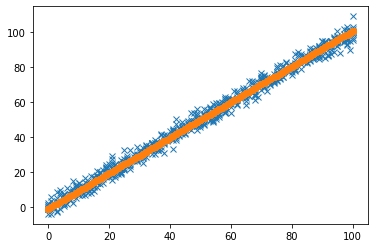

Iteration = 219, Loss = 4.026584814301679


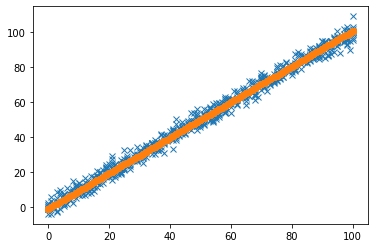

Iteration = 220, Loss = 4.026575517811477


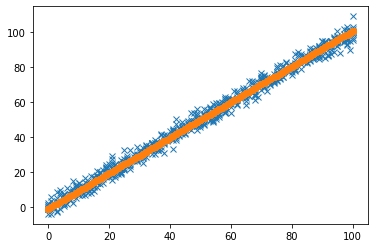

Iteration = 221, Loss = 4.026566222253494


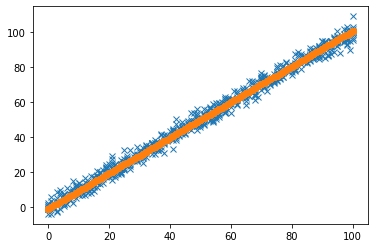

Iteration = 222, Loss = 4.026556927627639


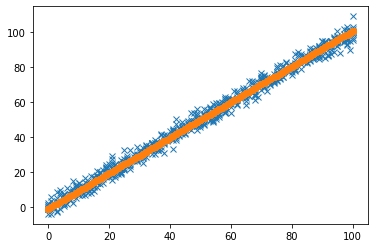

Iteration = 223, Loss = 4.026547633933819


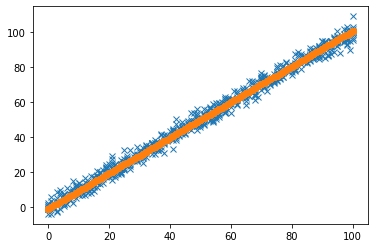

Iteration = 224, Loss = 4.026538341171938


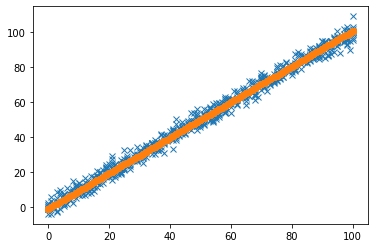

Iteration = 225, Loss = 4.026529049341903


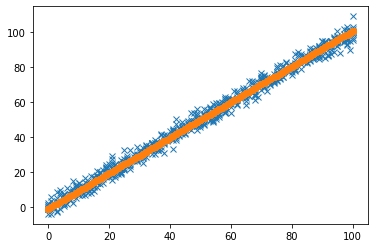

Iteration = 226, Loss = 4.026519758443624


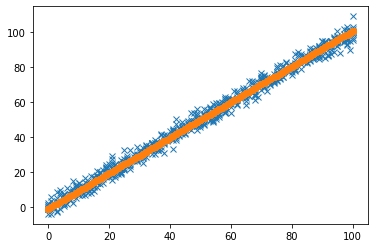

Iteration = 227, Loss = 4.026510468477002


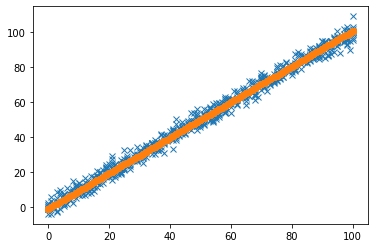

Iteration = 228, Loss = 4.026501179441947


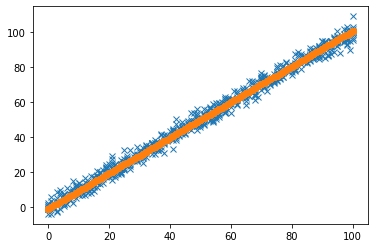

Iteration = 229, Loss = 4.026491891338366


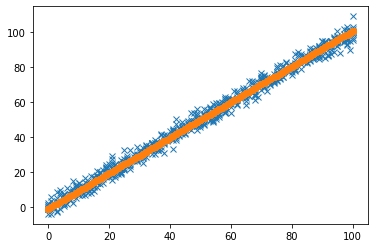

Iteration = 230, Loss = 4.026482604166167


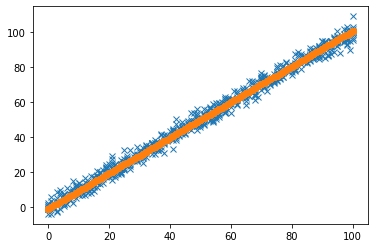

Iteration = 231, Loss = 4.026473317925251


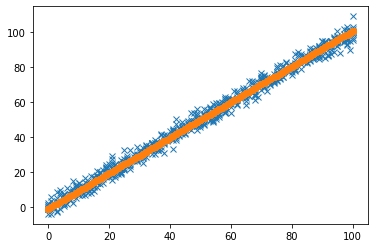

Iteration = 232, Loss = 4.026464032615528


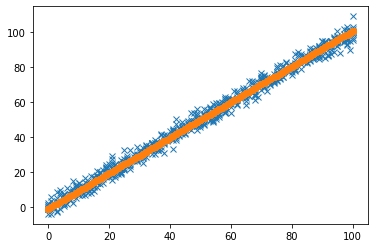

Iteration = 233, Loss = 4.026454748236906


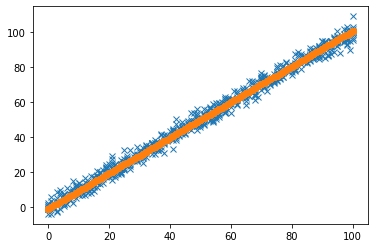

Iteration = 234, Loss = 4.026445464789289


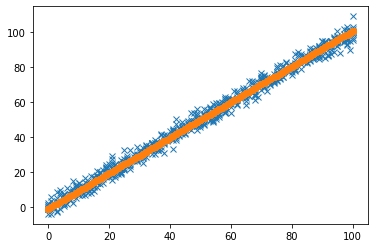

Iteration = 235, Loss = 4.026436182272586


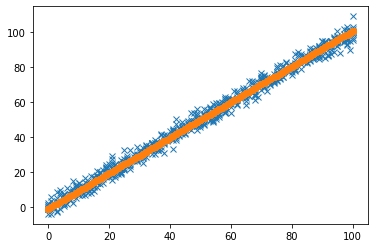

Iteration = 236, Loss = 4.026426900686702


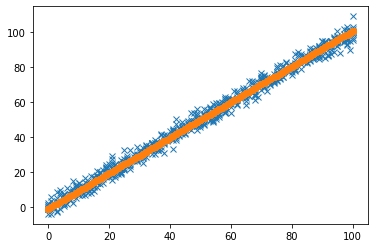

Iteration = 237, Loss = 4.026417620031543


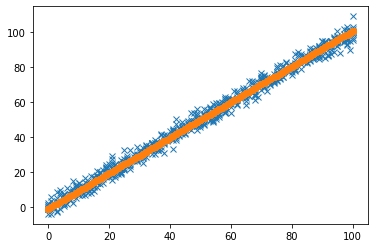

Iteration = 238, Loss = 4.026408340307018


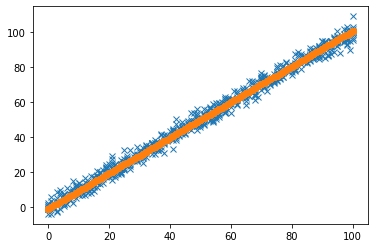

Iteration = 239, Loss = 4.02639906151303


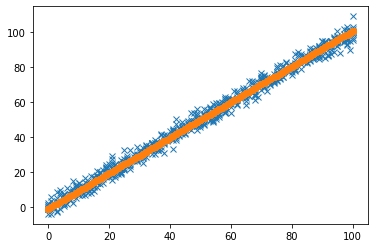

Iteration = 240, Loss = 4.026389783649492


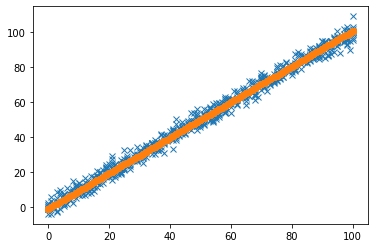

Iteration = 241, Loss = 4.026380506716305


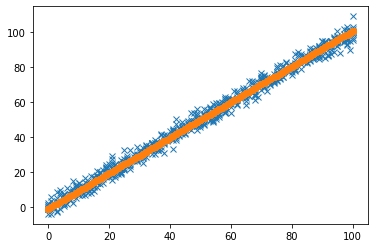

Iteration = 242, Loss = 4.026371230713376


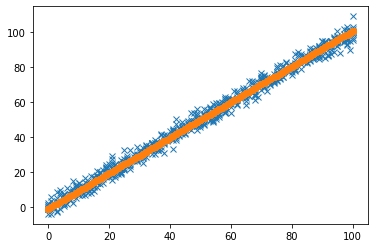

Iteration = 243, Loss = 4.026361955640616


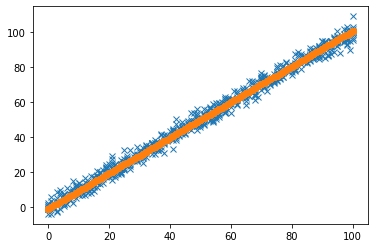

Iteration = 244, Loss = 4.026352681497928


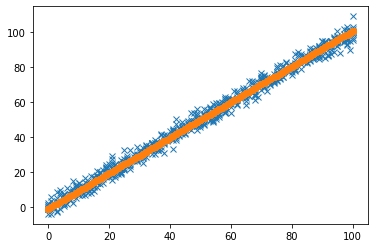

Iteration = 245, Loss = 4.026343408285219


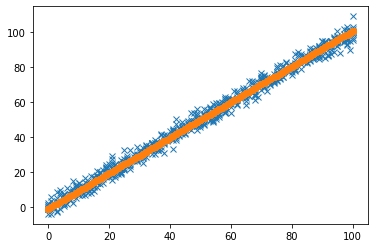

Iteration = 246, Loss = 4.026334136002398


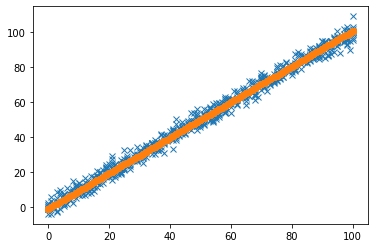

Iteration = 247, Loss = 4.026324864649367


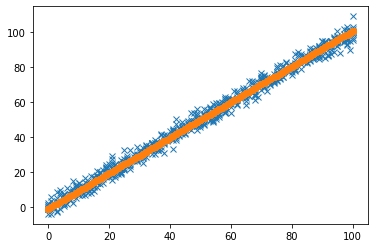

Iteration = 248, Loss = 4.026315594226039


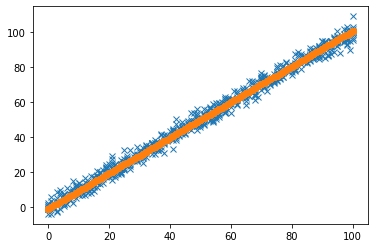

Iteration = 249, Loss = 4.0263063247323165


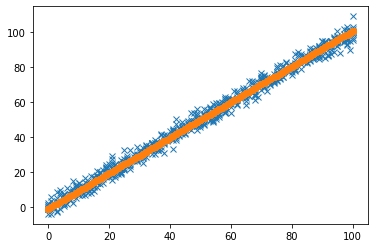

Iteration = 250, Loss = 4.026297056168108


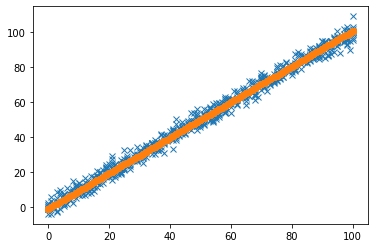

Iteration = 251, Loss = 4.02628778853332


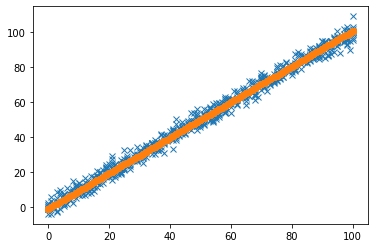

Iteration = 252, Loss = 4.026278521827859


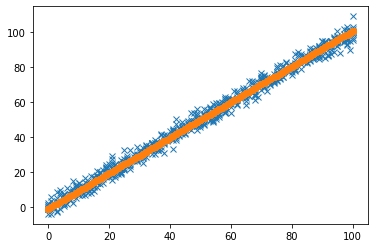

Iteration = 253, Loss = 4.026269256051633


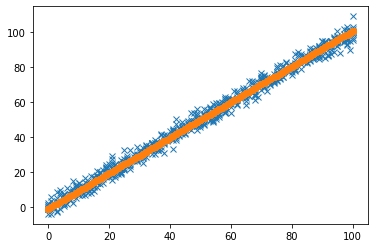

Iteration = 254, Loss = 4.026259991204547


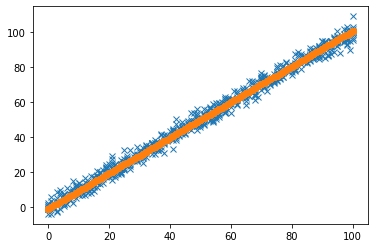

Iteration = 255, Loss = 4.0262507272865085


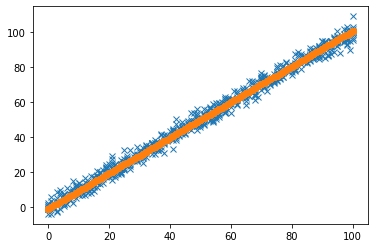

Iteration = 256, Loss = 4.026241464297423


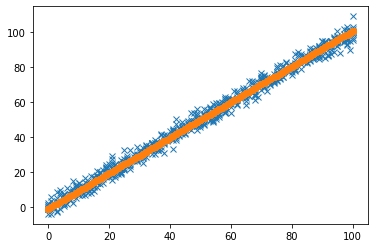

Iteration = 257, Loss = 4.0262322022372


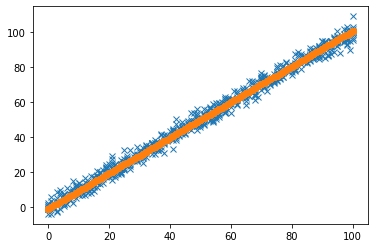

Iteration = 258, Loss = 4.026222941105745


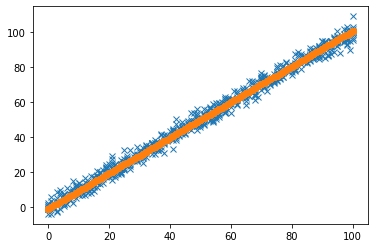

Iteration = 259, Loss = 4.0262136809029645


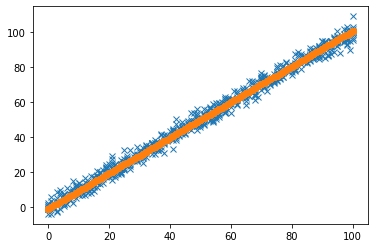

Iteration = 260, Loss = 4.026204421628768


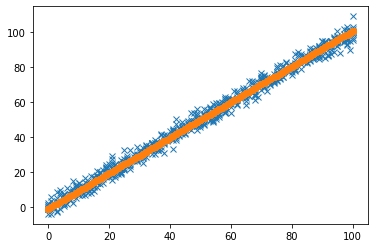

Iteration = 261, Loss = 4.026195163283059


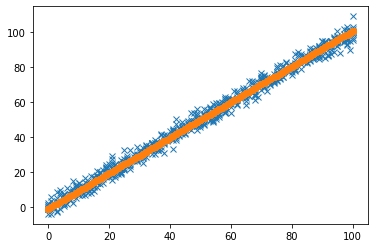

Iteration = 262, Loss = 4.026185905865745


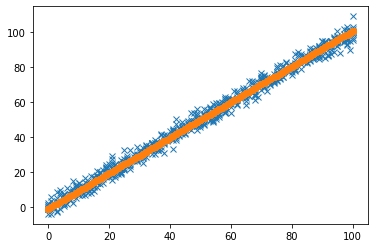

Iteration = 263, Loss = 4.026176649376734


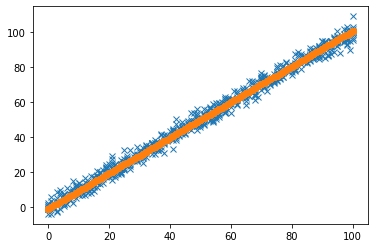

Iteration = 264, Loss = 4.026167393815932


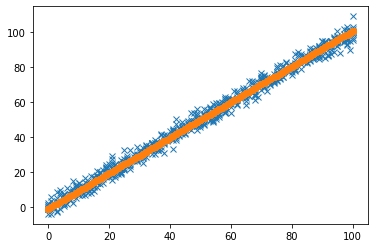

Iteration = 265, Loss = 4.026158139183246


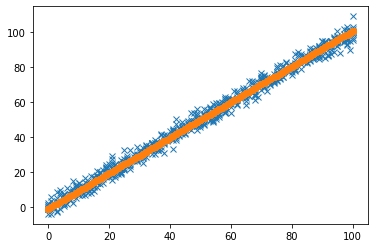

Iteration = 266, Loss = 4.0261488854785865


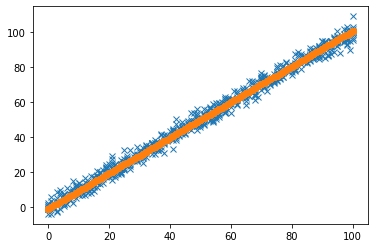

Iteration = 267, Loss = 4.026139632701852


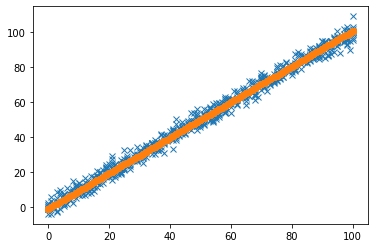

Iteration = 268, Loss = 4.02613038085296


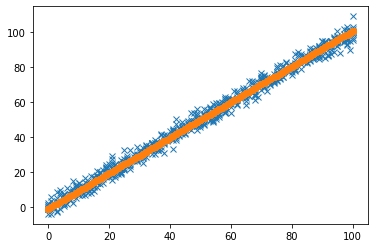

Iteration = 269, Loss = 4.026121129931808


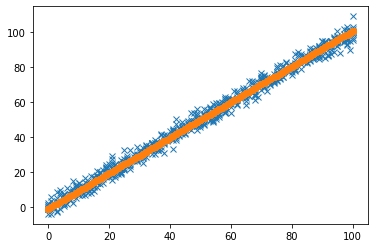

Iteration = 270, Loss = 4.02611187993831


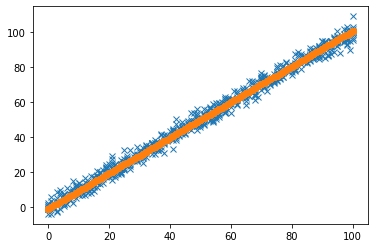

Iteration = 271, Loss = 4.026102630872369


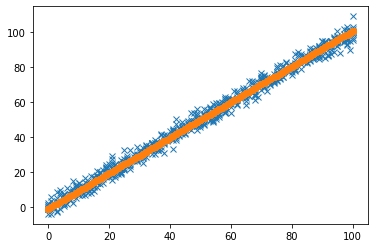

Iteration = 272, Loss = 4.026093382733895


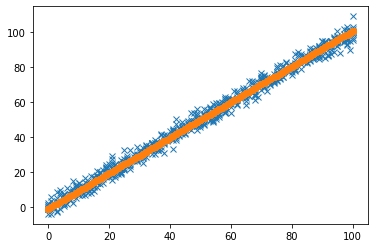

Iteration = 273, Loss = 4.026084135522789


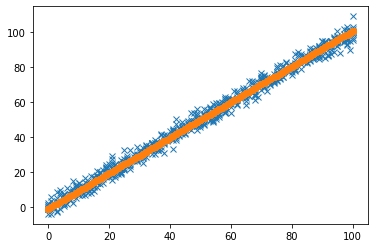

Iteration = 274, Loss = 4.0260748892389655


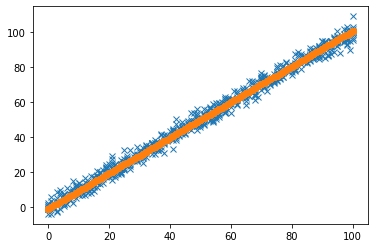

Iteration = 275, Loss = 4.026065643882327


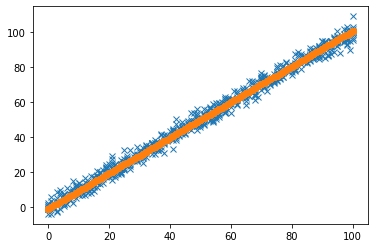

Iteration = 276, Loss = 4.026056399452782


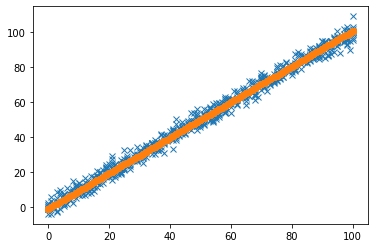

Iteration = 277, Loss = 4.026047155950236


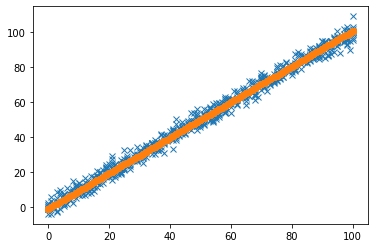

Iteration = 278, Loss = 4.0260379133746


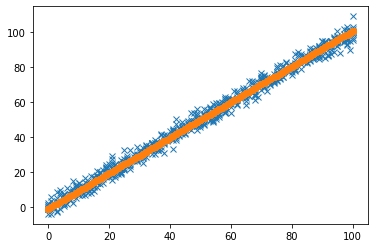

Iteration = 279, Loss = 4.0260286717257765


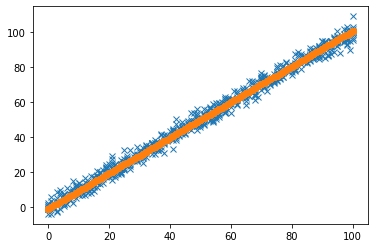

Iteration = 280, Loss = 4.026019431003674


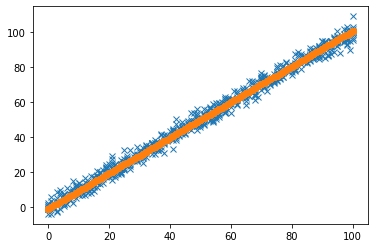

Iteration = 281, Loss = 4.026010191208199


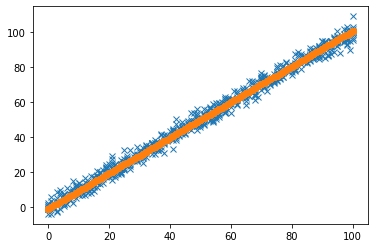

Iteration = 282, Loss = 4.0260009523392615


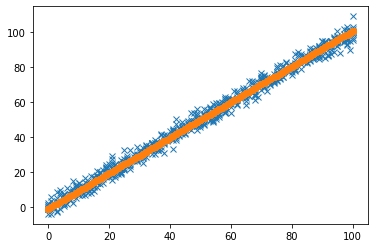

Iteration = 283, Loss = 4.025991714396766


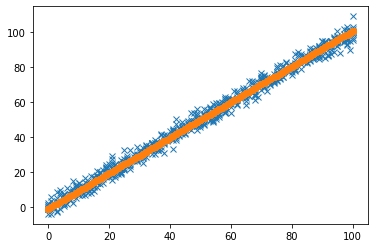

Iteration = 284, Loss = 4.02598247738062


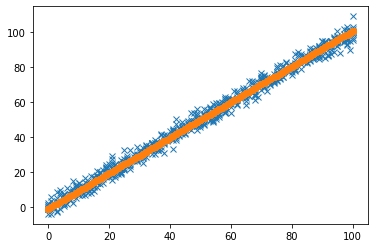

Iteration = 285, Loss = 4.025973241290731


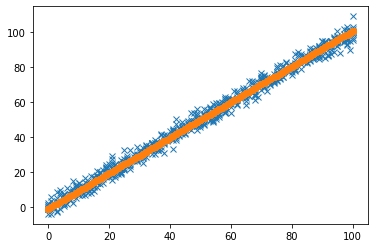

Iteration = 286, Loss = 4.025964006127006


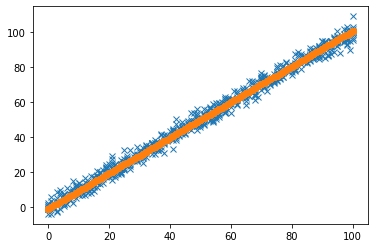

Iteration = 287, Loss = 4.025954771889352


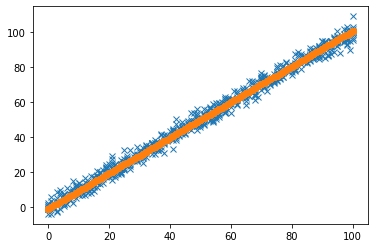

Iteration = 288, Loss = 4.025945538577675


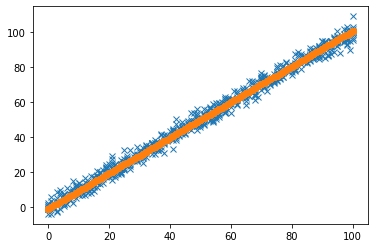

Iteration = 289, Loss = 4.025936306191885


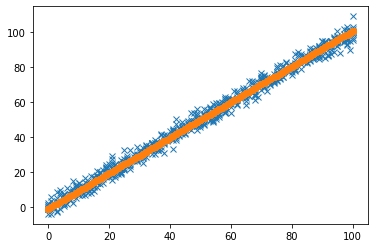

Iteration = 290, Loss = 4.025927074731887


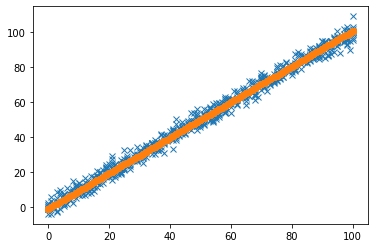

Iteration = 291, Loss = 4.025917844197587


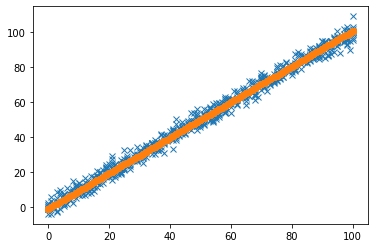

Iteration = 292, Loss = 4.025908614588897


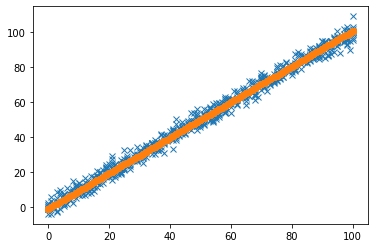

Iteration = 293, Loss = 4.025899385905718


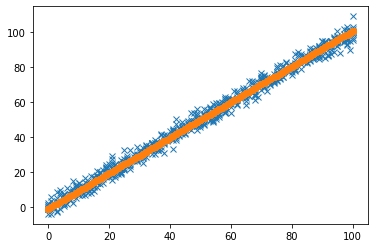

Iteration = 294, Loss = 4.025890158147963


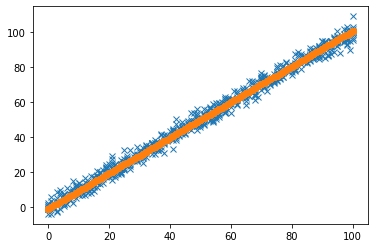

Iteration = 295, Loss = 4.025880931315536


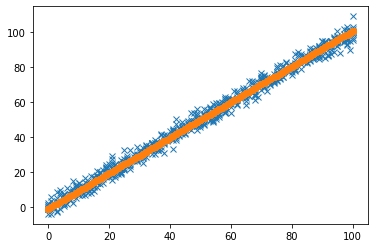

Iteration = 296, Loss = 4.025871705408343


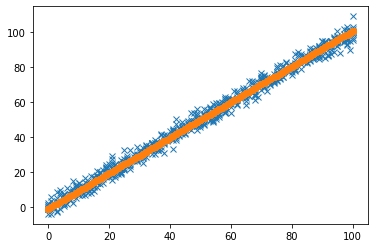

Iteration = 297, Loss = 4.025862480426293


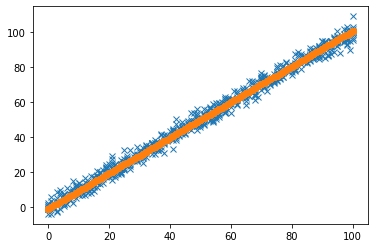

Iteration = 298, Loss = 4.025853256369293


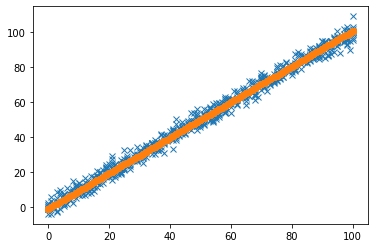

Iteration = 299, Loss = 4.02584403323725


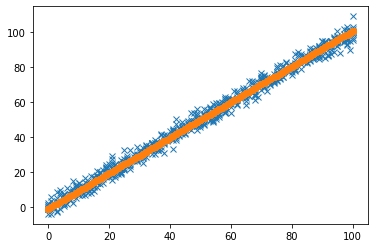

Iteration = 300, Loss = 4.025834811030071


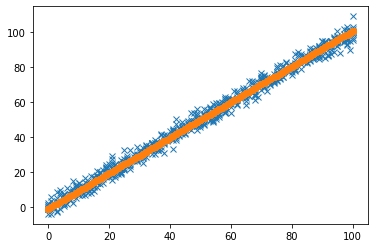

Iteration = 301, Loss = 4.025825589747666


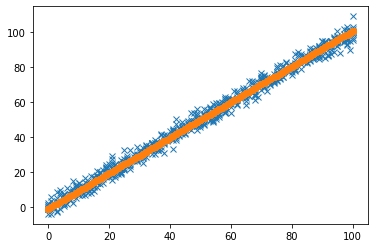

Iteration = 302, Loss = 4.02581636938994


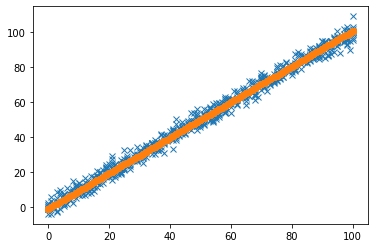

Iteration = 303, Loss = 4.0258071499567984


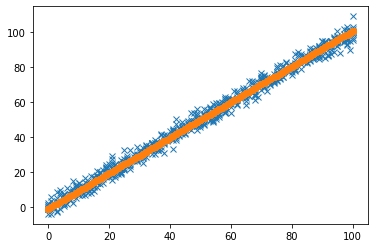

Iteration = 304, Loss = 4.025797931448152


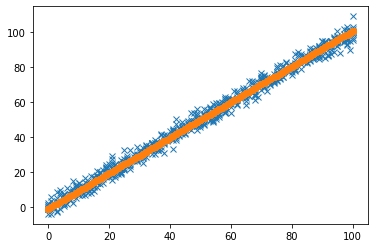

Iteration = 305, Loss = 4.025788713863906


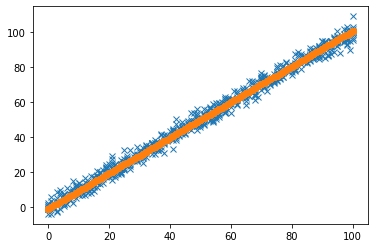

Iteration = 306, Loss = 4.025779497203969


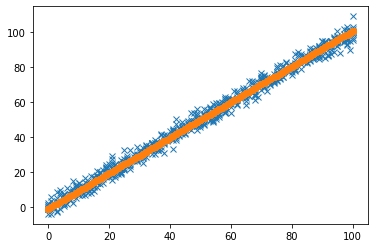

Iteration = 307, Loss = 4.0257702814682474


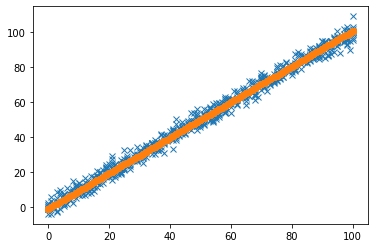

Iteration = 308, Loss = 4.025761066656647


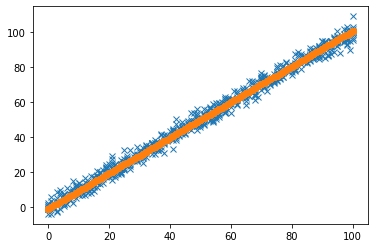

Iteration = 309, Loss = 4.025751852769079


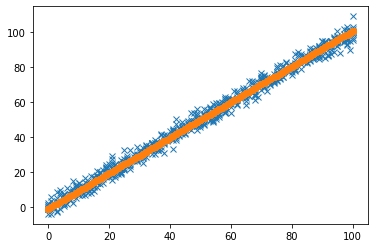

Iteration = 310, Loss = 4.025742639805447


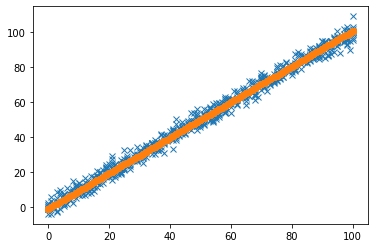

Iteration = 311, Loss = 4.025733427765661


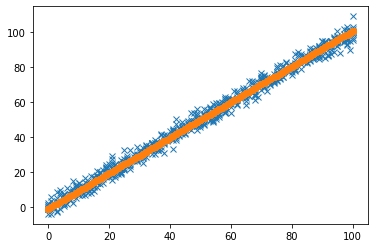

Iteration = 312, Loss = 4.025724216649625


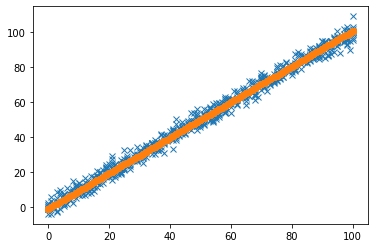

Iteration = 313, Loss = 4.025715006457251


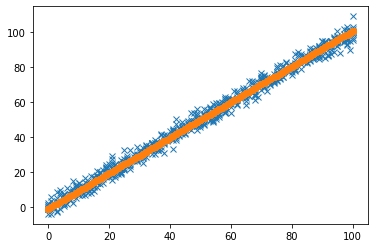

Iteration = 314, Loss = 4.025705797188443


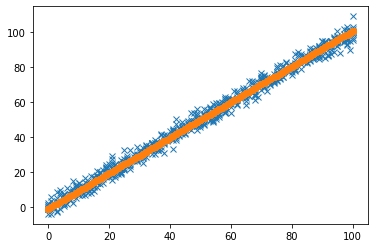

Iteration = 315, Loss = 4.025696588843109


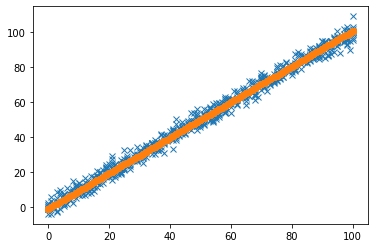

Iteration = 316, Loss = 4.025687381421158


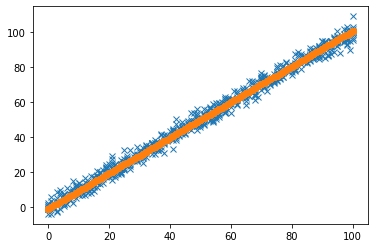

Iteration = 317, Loss = 4.025678174922495


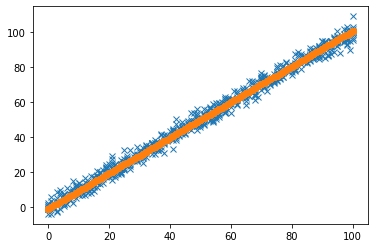

Iteration = 318, Loss = 4.025668969347032


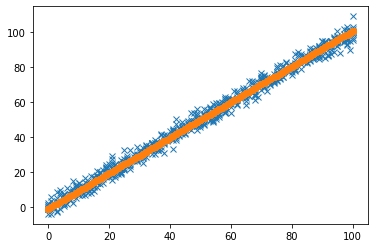

Iteration = 319, Loss = 4.025659764694667


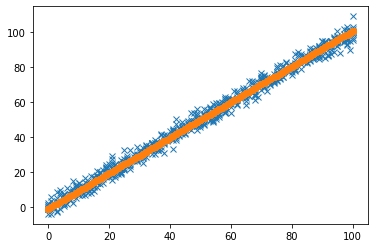

Iteration = 320, Loss = 4.0256505609653175


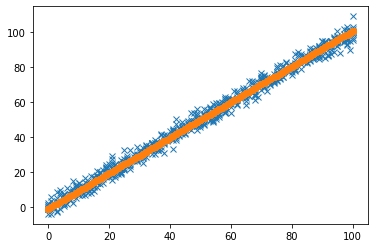

Iteration = 321, Loss = 4.025641358158887


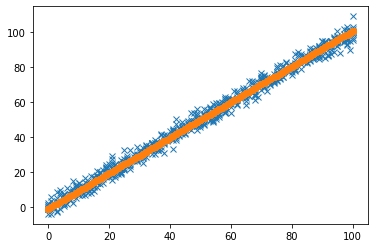

Iteration = 322, Loss = 4.0256321562752815


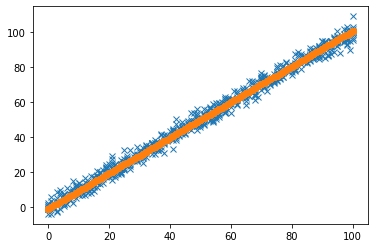

Iteration = 323, Loss = 4.025622955314412


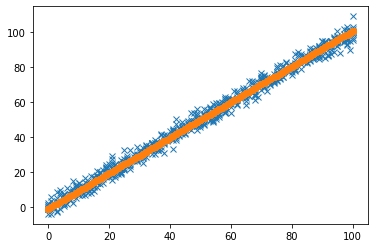

Iteration = 324, Loss = 4.025613755276181


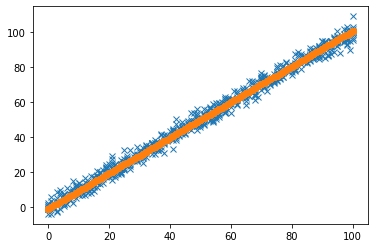

Iteration = 325, Loss = 4.025604556160499


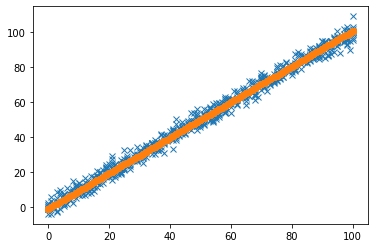

Iteration = 326, Loss = 4.0255953579672745


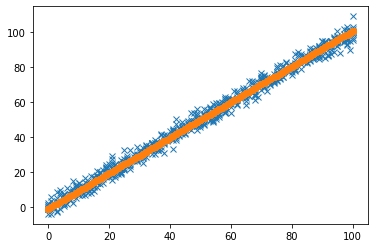

Iteration = 327, Loss = 4.025586160696414


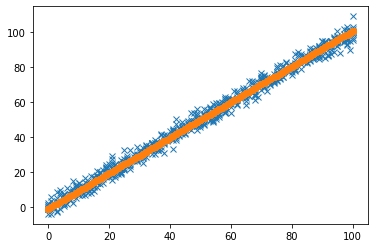

Iteration = 328, Loss = 4.025576964347825


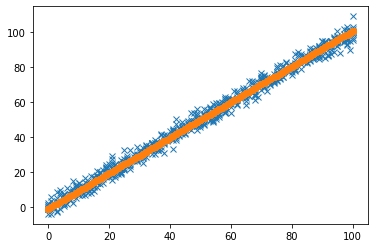

Iteration = 329, Loss = 4.025567768921413


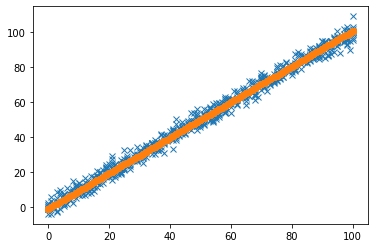

Iteration = 330, Loss = 4.025558574417089


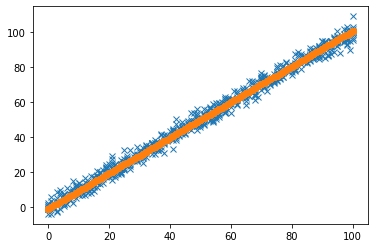

Iteration = 331, Loss = 4.025549380834757


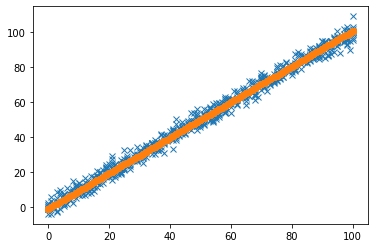

Iteration = 332, Loss = 4.025540188174329


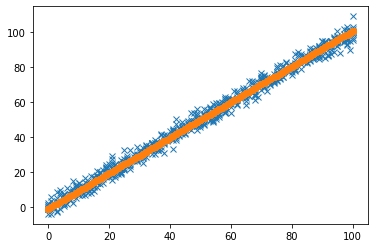

Iteration = 333, Loss = 4.025530996435708


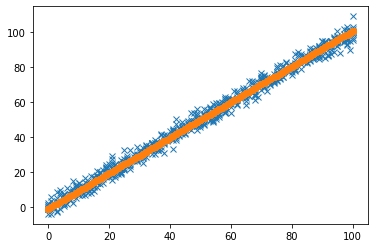

Iteration = 334, Loss = 4.025521805618805


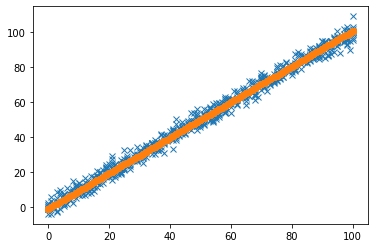

Iteration = 335, Loss = 4.0255126157235255


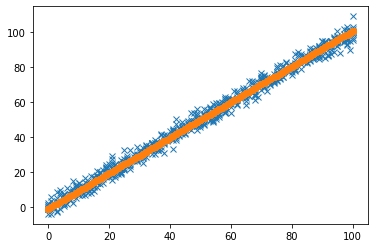

Iteration = 336, Loss = 4.025503426749776


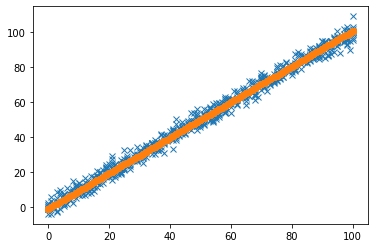

Iteration = 337, Loss = 4.025494238697468


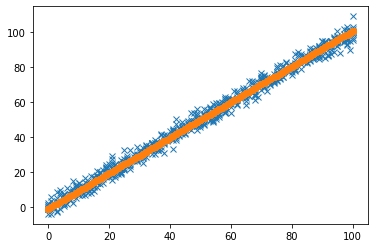

Iteration = 338, Loss = 4.0254850515665055


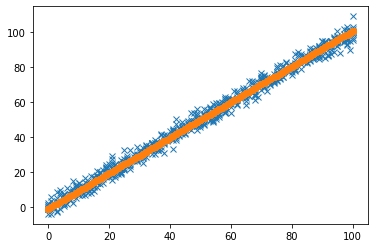

Iteration = 339, Loss = 4.025475865356798


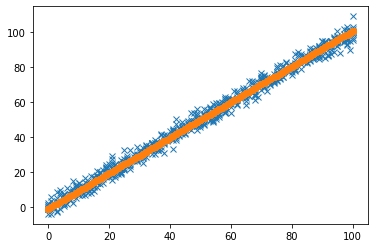

Iteration = 340, Loss = 4.025466680068252


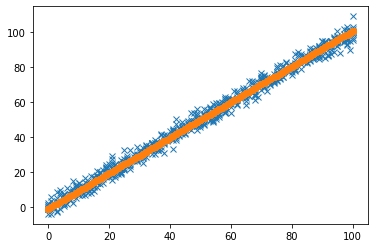

Iteration = 341, Loss = 4.025457495700778


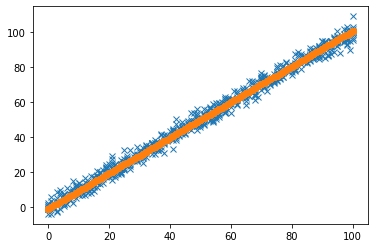

Iteration = 342, Loss = 4.025448312254279


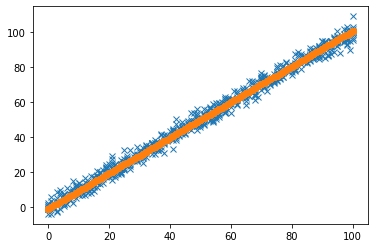

Iteration = 343, Loss = 4.025439129728666


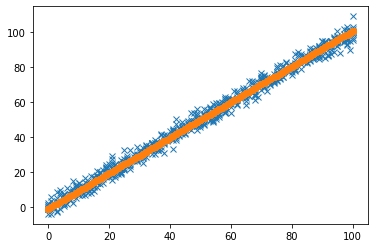

Iteration = 344, Loss = 4.025429948123846


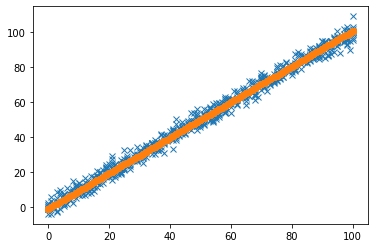

Iteration = 345, Loss = 4.025420767439725


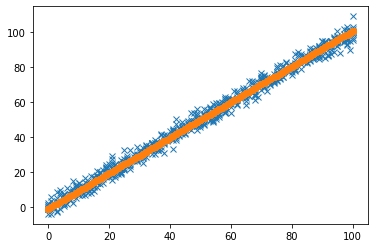

Iteration = 346, Loss = 4.025411587676213


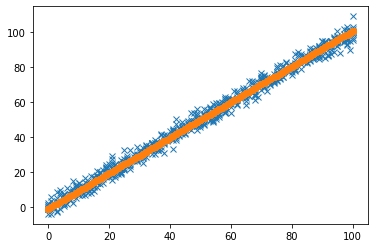

Iteration = 347, Loss = 4.025402408833217


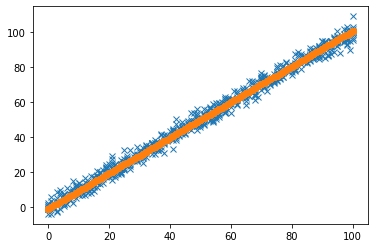

Iteration = 348, Loss = 4.025393230910642


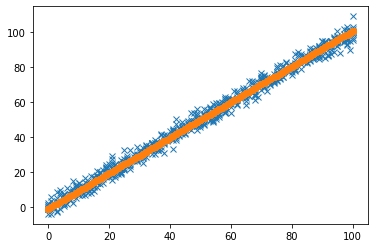

Iteration = 349, Loss = 4.0253840539084


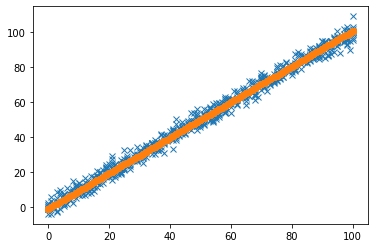

Iteration = 350, Loss = 4.0253748778263985


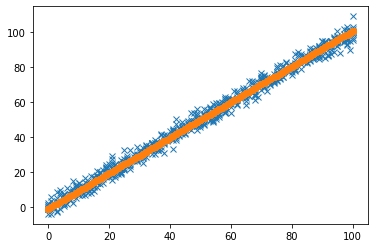

Iteration = 351, Loss = 4.0253657026645415


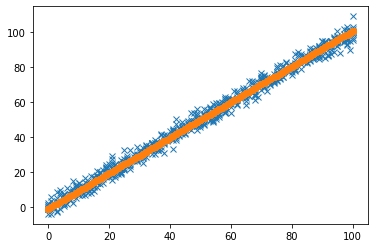

Iteration = 352, Loss = 4.02535652842274


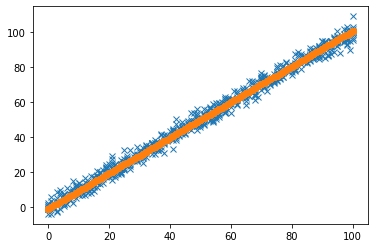

Iteration = 353, Loss = 4.025347355100899


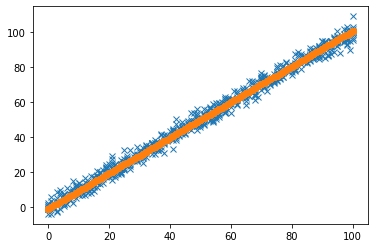

Iteration = 354, Loss = 4.025338182698928


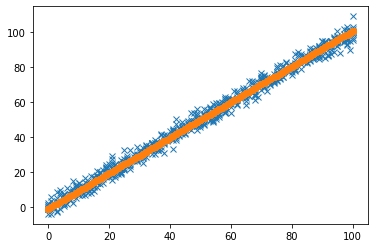

Iteration = 355, Loss = 4.025329011216734


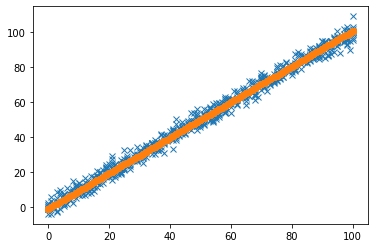

Iteration = 356, Loss = 4.025319840654227


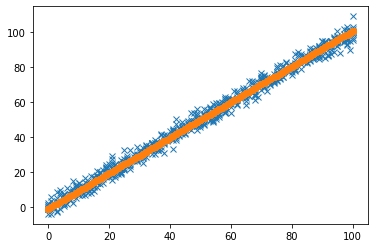

Iteration = 357, Loss = 4.0253106710113125


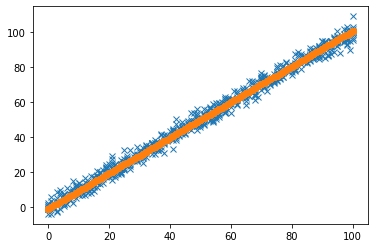

Iteration = 358, Loss = 4.025301502287898


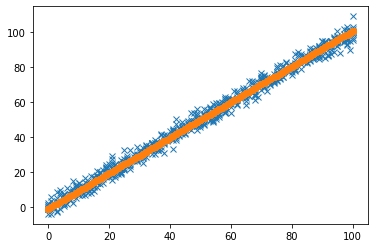

Iteration = 359, Loss = 4.025292334483893


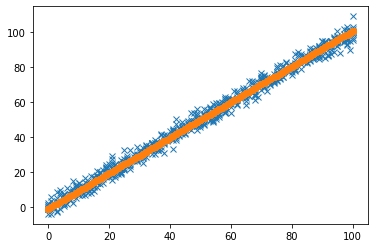

Iteration = 360, Loss = 4.025283167599204


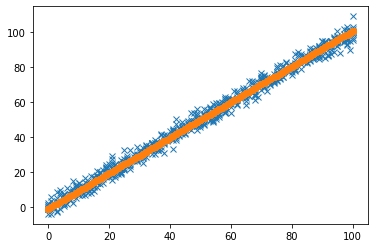

Iteration = 361, Loss = 4.025274001633739


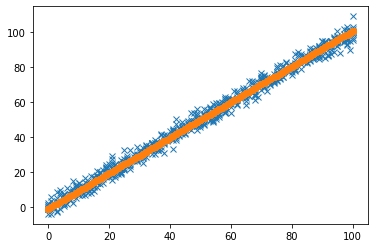

Iteration = 362, Loss = 4.0252648365874055


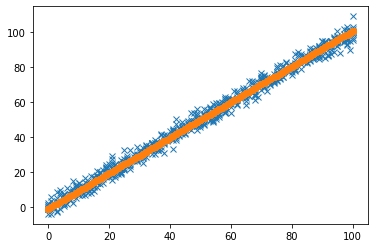

Iteration = 363, Loss = 4.025255672460113


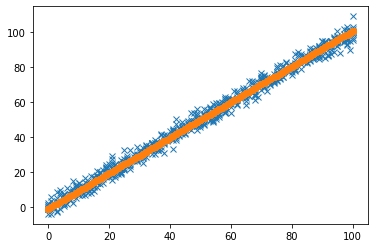

Iteration = 364, Loss = 4.025246509251769


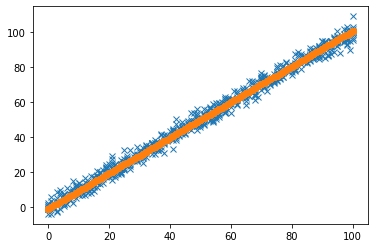

Iteration = 365, Loss = 4.02523734696228


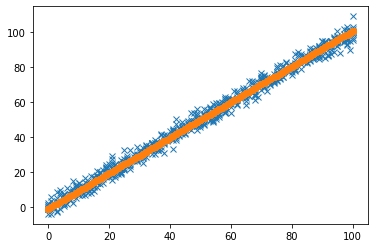

Iteration = 366, Loss = 4.025228185591552


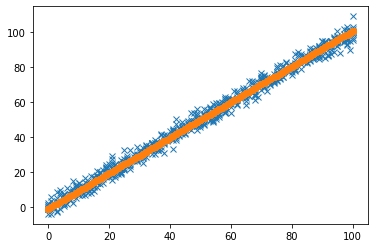

Iteration = 367, Loss = 4.025219025139498


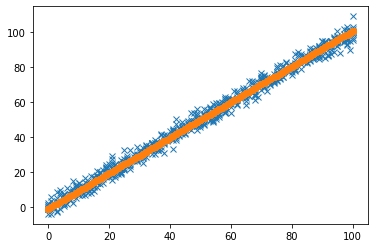

Iteration = 368, Loss = 4.025209865606024


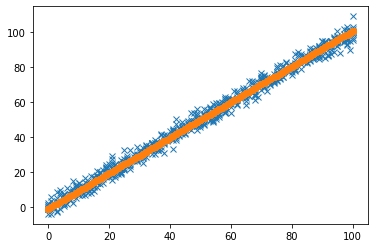

Iteration = 369, Loss = 4.025200706991035


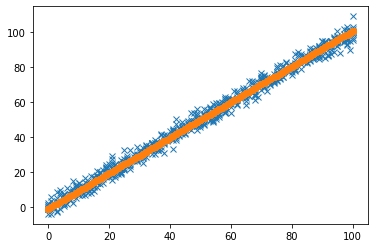

Iteration = 370, Loss = 4.025191549294442


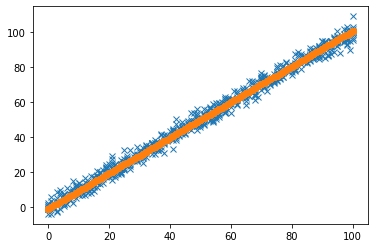

Iteration = 371, Loss = 4.025182392516152


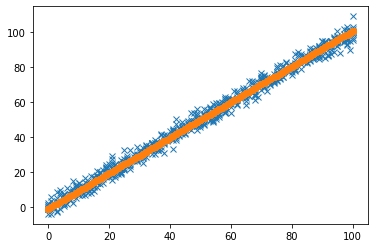

Iteration = 372, Loss = 4.025173236656074


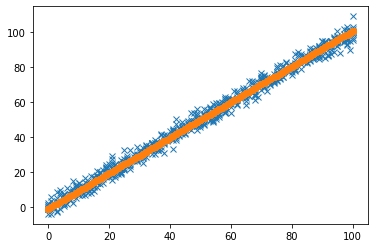

Iteration = 373, Loss = 4.025164081714112


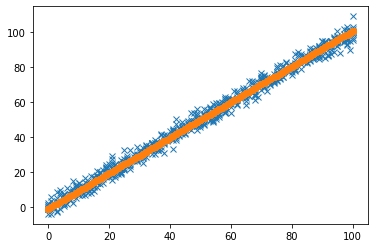

Iteration = 374, Loss = 4.025154927690178


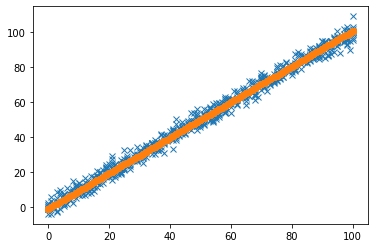

Iteration = 375, Loss = 4.025145774584178


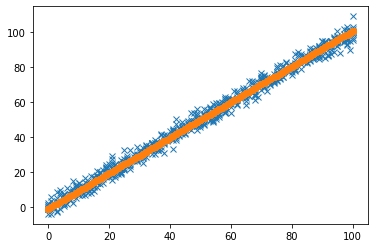

Iteration = 376, Loss = 4.025136622396022


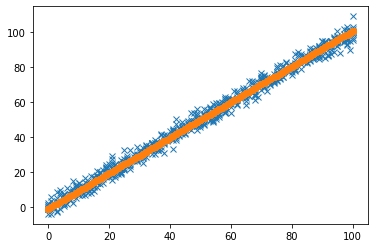

Iteration = 377, Loss = 4.025127471125616


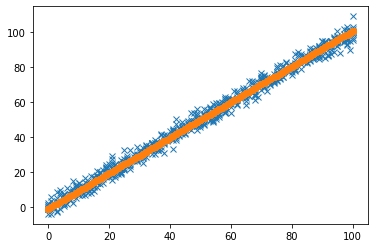

Iteration = 378, Loss = 4.025118320772868


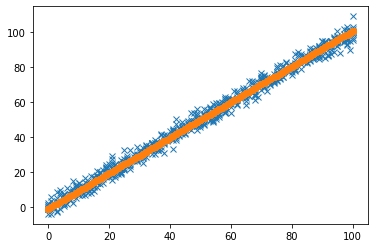

Iteration = 379, Loss = 4.025109171337686


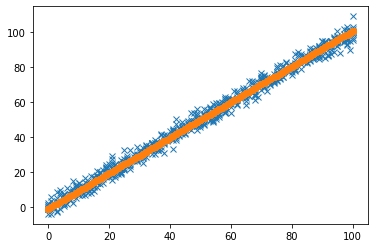

Iteration = 380, Loss = 4.02510002281998


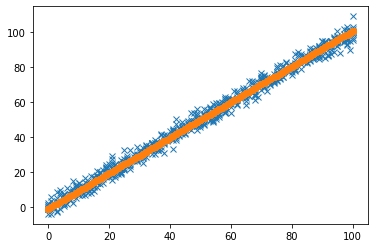

Iteration = 381, Loss = 4.025090875219655


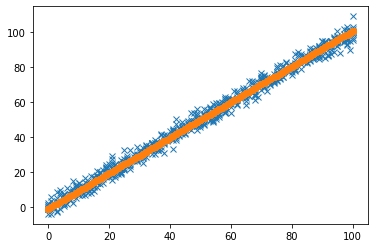

Iteration = 382, Loss = 4.0250817285366205


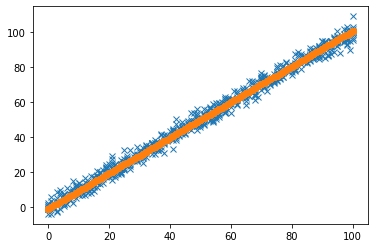

Iteration = 383, Loss = 4.025072582770786


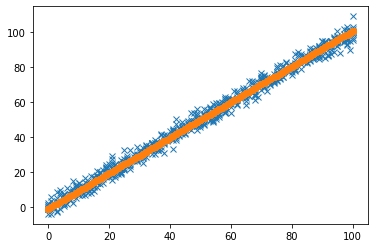

Iteration = 384, Loss = 4.025063437922057


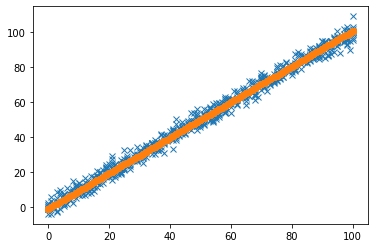

Iteration = 385, Loss = 4.025054293990343


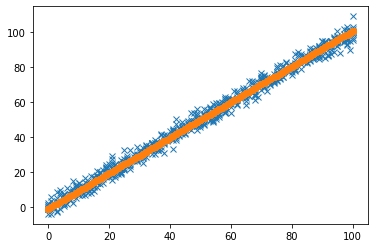

Iteration = 386, Loss = 4.0250451509755525


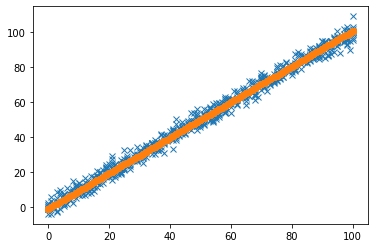

Iteration = 387, Loss = 4.025036008877589


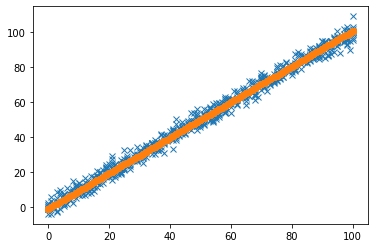

Iteration = 388, Loss = 4.0250268676963685


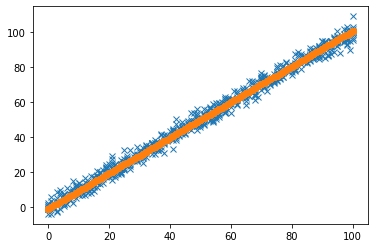

Iteration = 389, Loss = 4.025017727431791


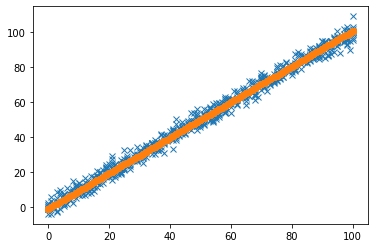

Iteration = 390, Loss = 4.0250085880837725


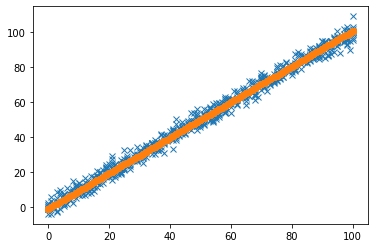

Iteration = 391, Loss = 4.0249994496522135


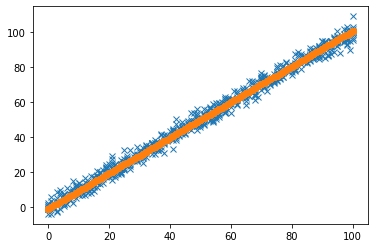

Iteration = 392, Loss = 4.024990312137027


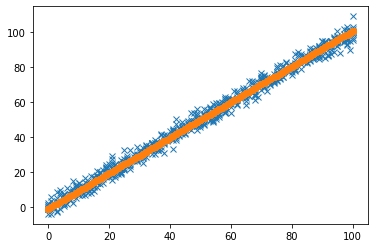

Iteration = 393, Loss = 4.024981175538121


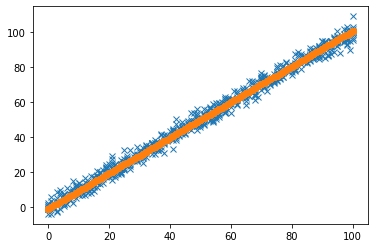

Iteration = 394, Loss = 4.024972039855401


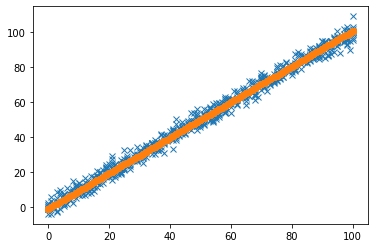

Iteration = 395, Loss = 4.024962905088776


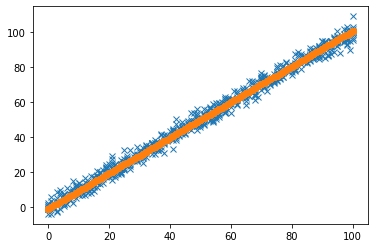

Iteration = 396, Loss = 4.024953771238156


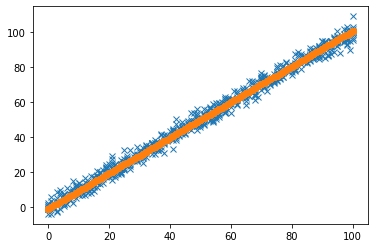

Iteration = 397, Loss = 4.024944638303446


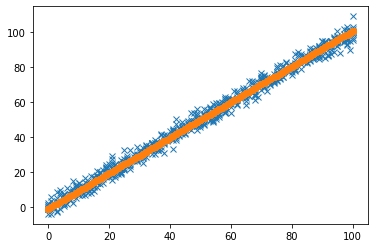

Iteration = 398, Loss = 4.024935506284556


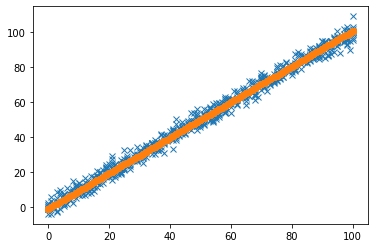

Iteration = 399, Loss = 4.024926375181394


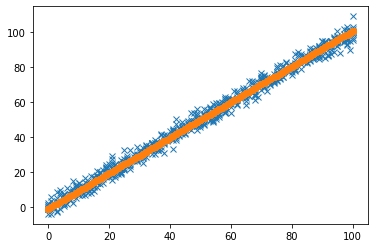

Iteration = 400, Loss = 4.024917244993869


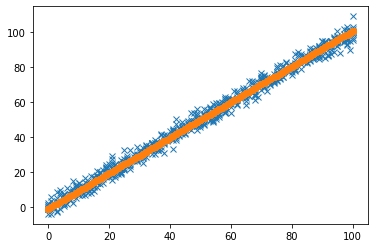

Iteration = 401, Loss = 4.024908115721887


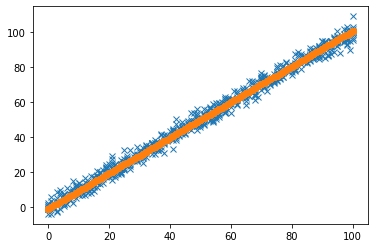

Iteration = 402, Loss = 4.02489898736536


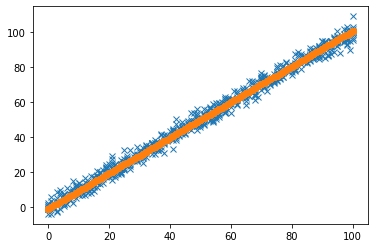

Iteration = 403, Loss = 4.024889859924192


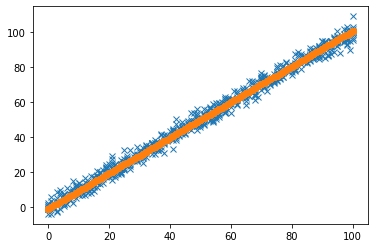

Iteration = 404, Loss = 4.0248807333982946


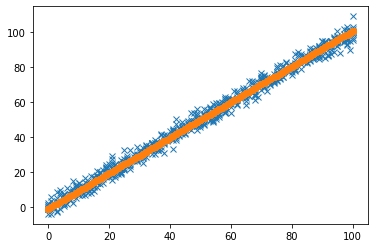

Iteration = 405, Loss = 4.024871607787571


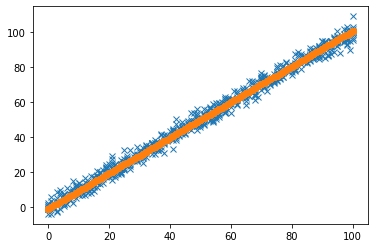

Iteration = 406, Loss = 4.024862483091938


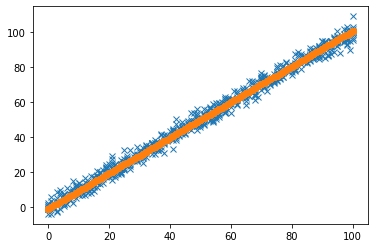

Iteration = 407, Loss = 4.024853359311294


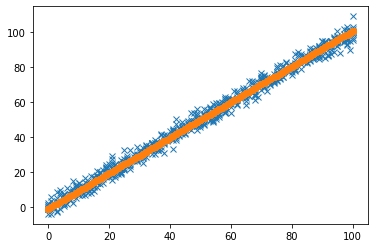

Iteration = 408, Loss = 4.024844236445554


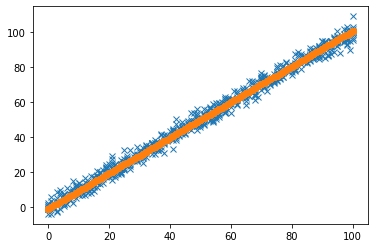

Iteration = 409, Loss = 4.024835114494623


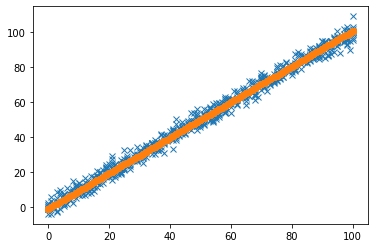

Iteration = 410, Loss = 4.024825993458413


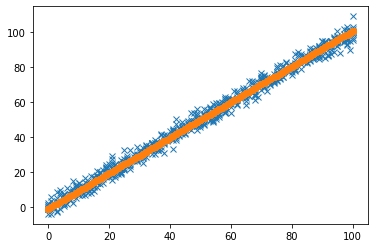

Iteration = 411, Loss = 4.024816873336826


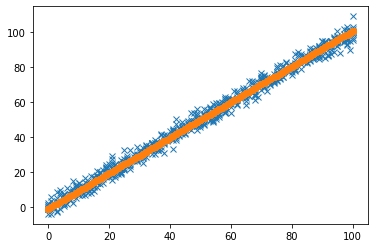

Iteration = 412, Loss = 4.024807754129776


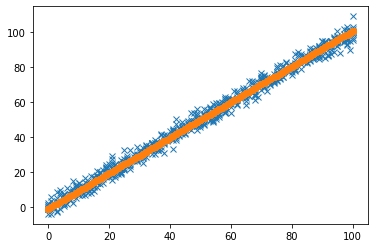

Iteration = 413, Loss = 4.024798635837172


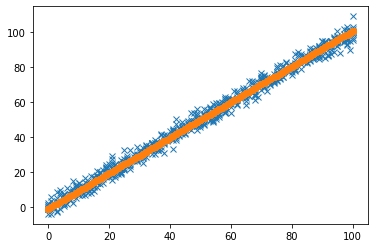

Iteration = 414, Loss = 4.024789518458915


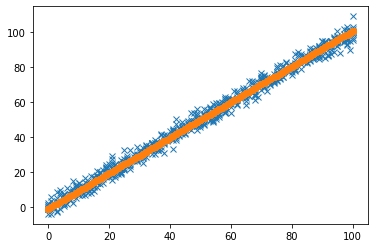

Iteration = 415, Loss = 4.024780401994921


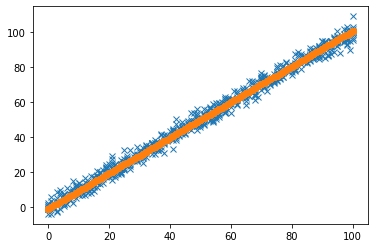

Iteration = 416, Loss = 4.024771286445094


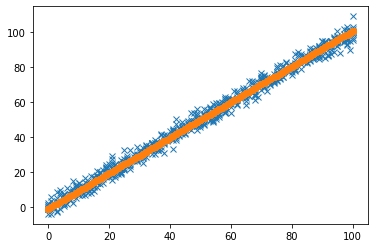

Iteration = 417, Loss = 4.024762171809344


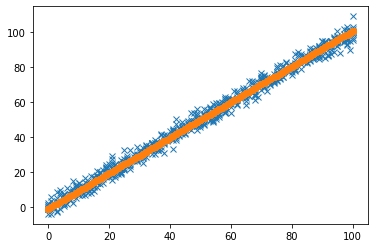

Iteration = 418, Loss = 4.024753058087578


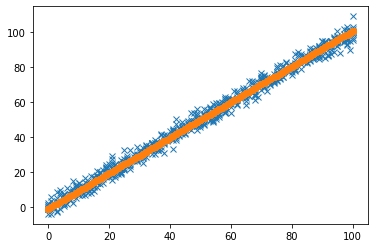

Iteration = 419, Loss = 4.024743945279706


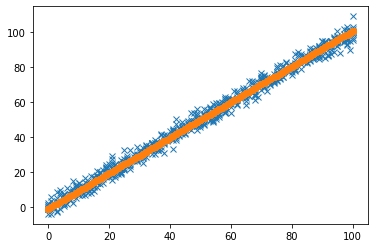

Iteration = 420, Loss = 4.024734833385636


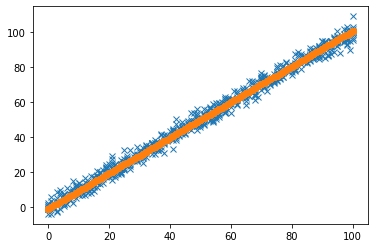

Iteration = 421, Loss = 4.024725722405275


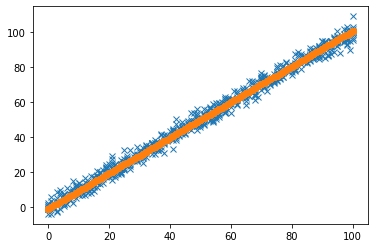

Iteration = 422, Loss = 4.024716612338533


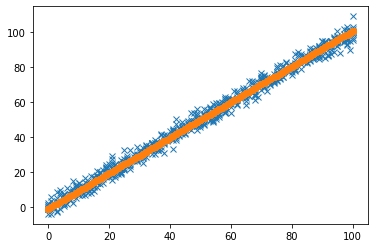

Iteration = 423, Loss = 4.024707503185317


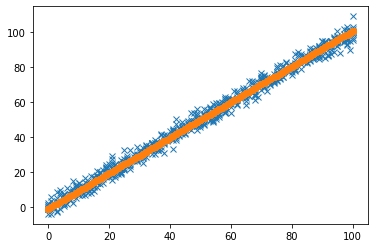

Iteration = 424, Loss = 4.0246983949455375


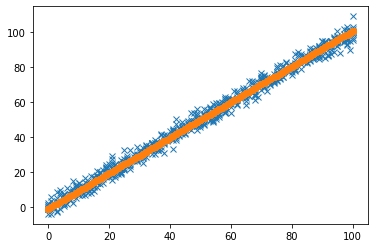

Iteration = 425, Loss = 4.0246892876191005


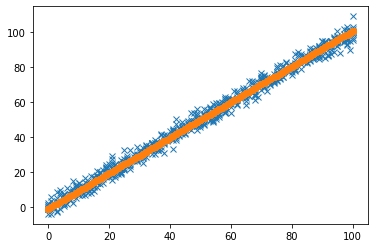

Iteration = 426, Loss = 4.024680181205915


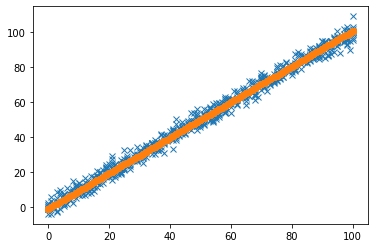

Iteration = 427, Loss = 4.024671075705891


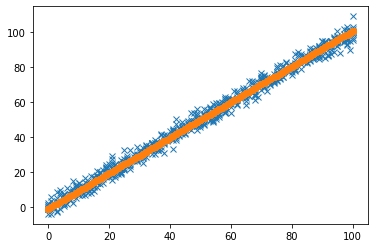

Iteration = 428, Loss = 4.024661971118937


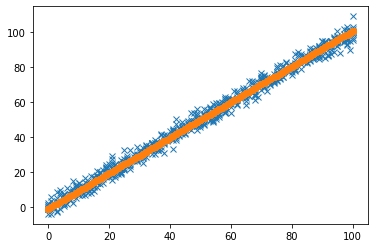

Iteration = 429, Loss = 4.024652867444959


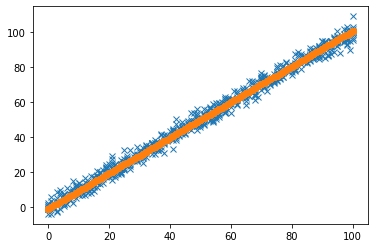

Iteration = 430, Loss = 4.024643764683864


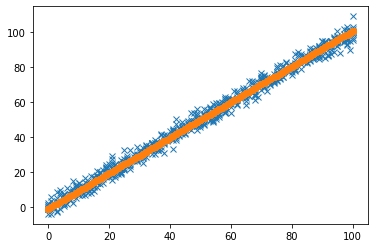

Iteration = 431, Loss = 4.024634662835567


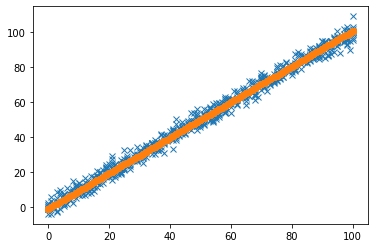

Iteration = 432, Loss = 4.024625561899971


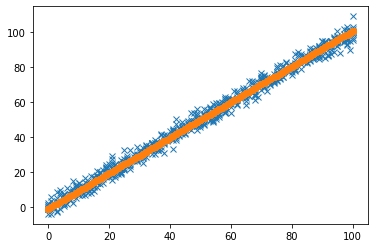

Iteration = 433, Loss = 4.0246164618769855


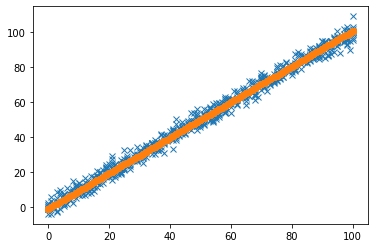

Iteration = 434, Loss = 4.02460736276652


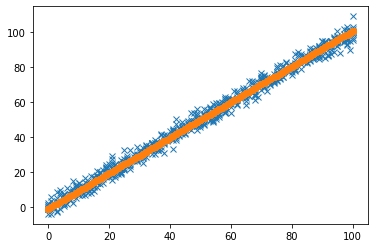

Iteration = 435, Loss = 4.024598264568484


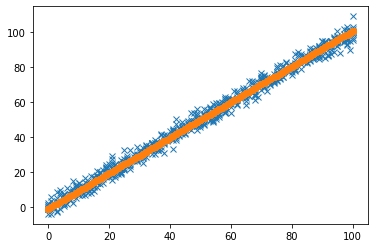

Iteration = 436, Loss = 4.024589167282784


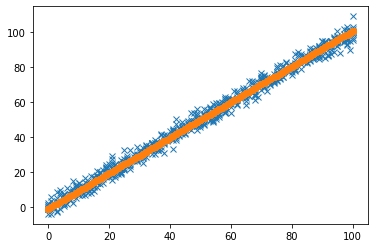

Iteration = 437, Loss = 4.0245800709093285


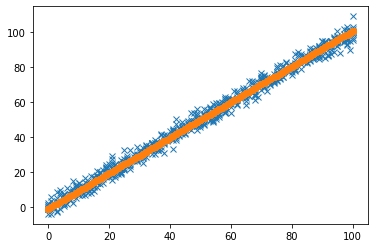

Iteration = 438, Loss = 4.024570975448027


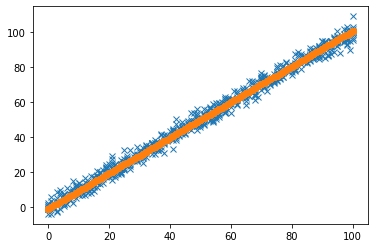

Iteration = 439, Loss = 4.024561880898787


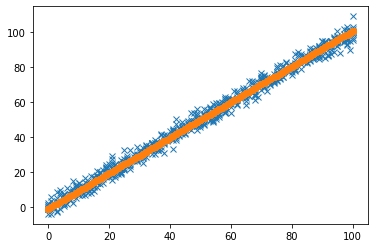

Iteration = 440, Loss = 4.024552787261518


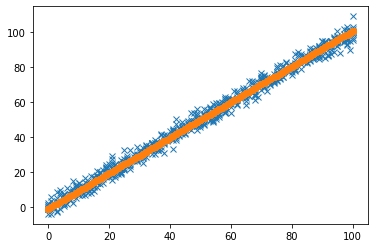

Iteration = 441, Loss = 4.024543694536128


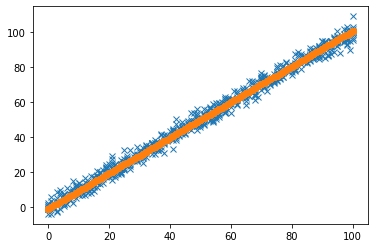

Iteration = 442, Loss = 4.024534602722526


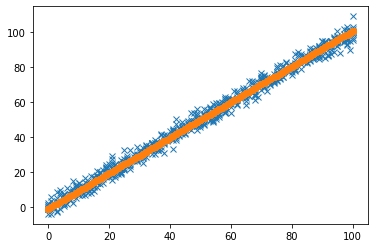

Iteration = 443, Loss = 4.024525511820619


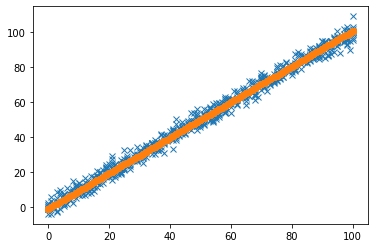

Iteration = 444, Loss = 4.02451642183032


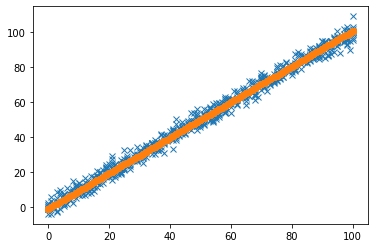

Iteration = 445, Loss = 4.024507332751535


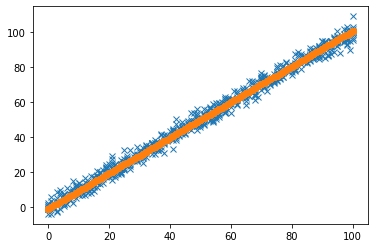

Iteration = 446, Loss = 4.024498244584169


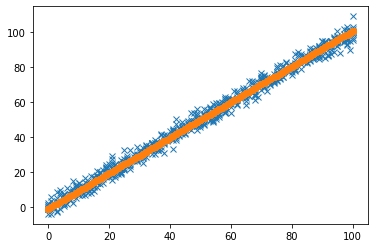

Iteration = 447, Loss = 4.024489157328135


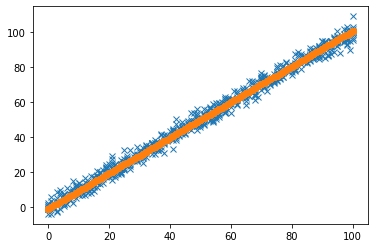

Iteration = 448, Loss = 4.024480070983341


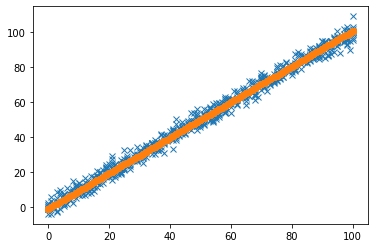

Iteration = 449, Loss = 4.0244709855496925


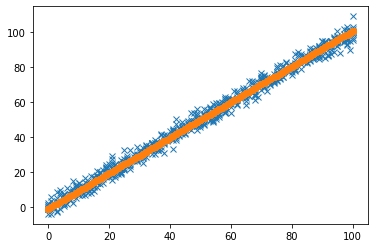

Iteration = 450, Loss = 4.024461901027103


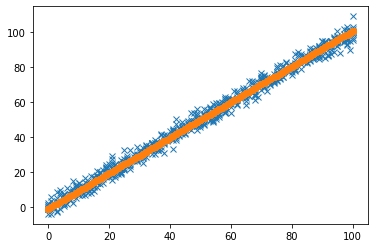

Iteration = 451, Loss = 4.024452817415479


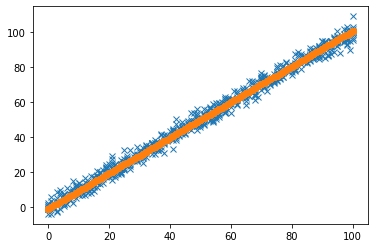

Iteration = 452, Loss = 4.024443734714726


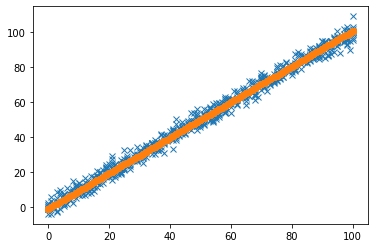

Iteration = 453, Loss = 4.024434652924759


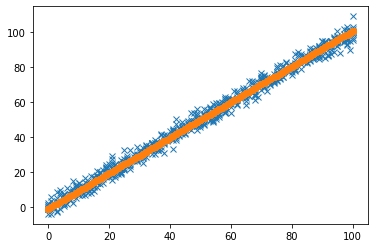

Iteration = 454, Loss = 4.024425572045481


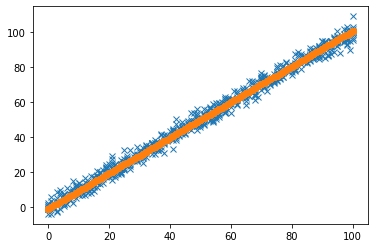

Iteration = 455, Loss = 4.024416492076805


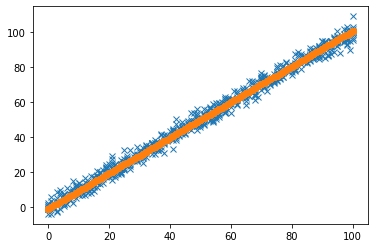

Iteration = 456, Loss = 4.024407413018635


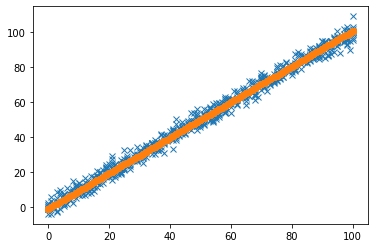

Iteration = 457, Loss = 4.024398334870885


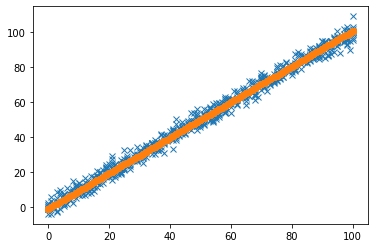

Iteration = 458, Loss = 4.024389257633459


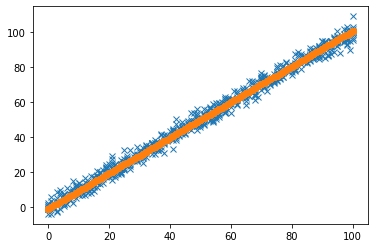

Iteration = 459, Loss = 4.0243801813062685


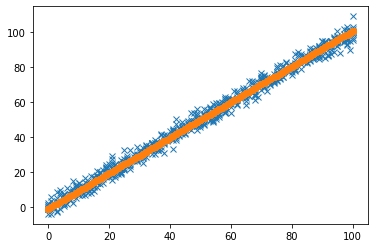

Iteration = 460, Loss = 4.024371105889222


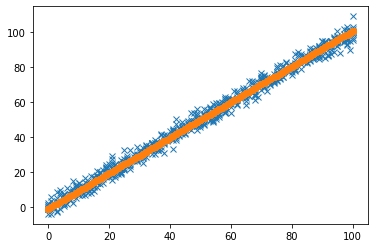

Iteration = 461, Loss = 4.024362031382228


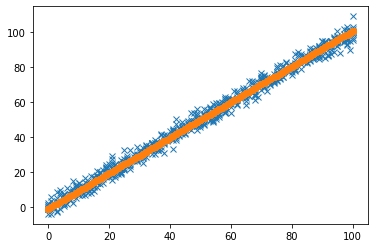

Iteration = 462, Loss = 4.024352957785195


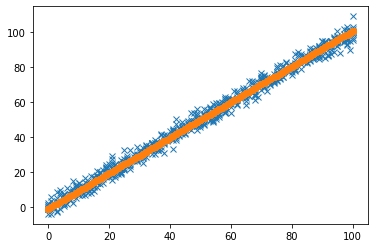

Iteration = 463, Loss = 4.024343885098029


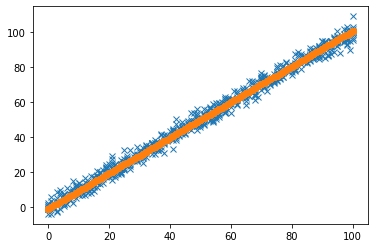

Iteration = 464, Loss = 4.024334813320644


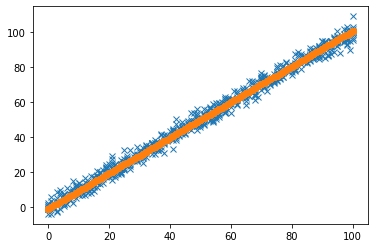

Iteration = 465, Loss = 4.0243257424529455


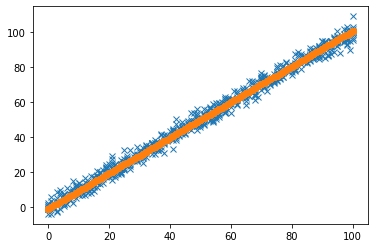

Iteration = 466, Loss = 4.024316672494842


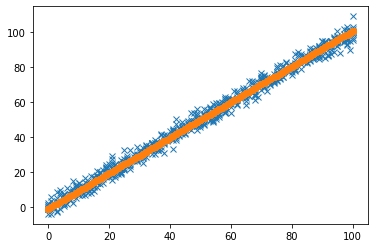

Iteration = 467, Loss = 4.024307603446245


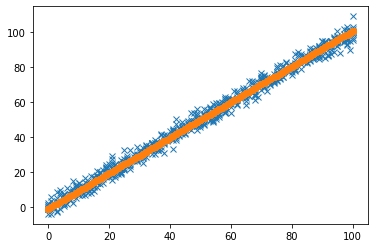

Iteration = 468, Loss = 4.024298535307061


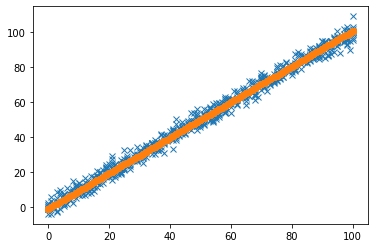

Iteration = 469, Loss = 4.0242894680772


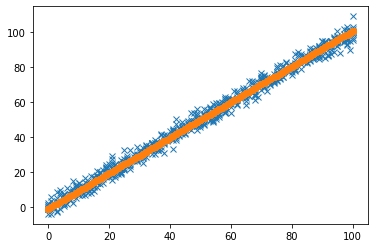

Iteration = 470, Loss = 4.024280401756567


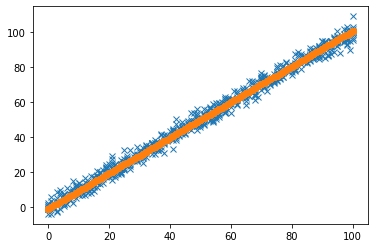

Iteration = 471, Loss = 4.024271336345077


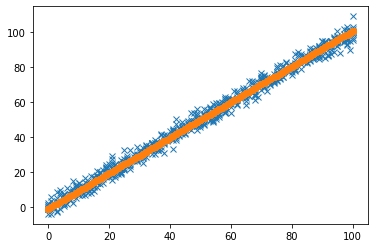

Iteration = 472, Loss = 4.0242622718426375


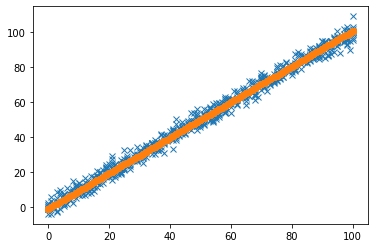

Iteration = 473, Loss = 4.024253208249152


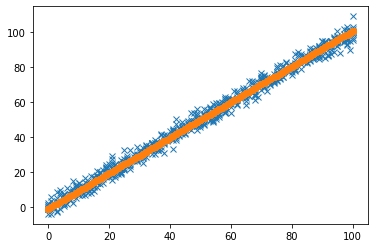

Iteration = 474, Loss = 4.024244145564534


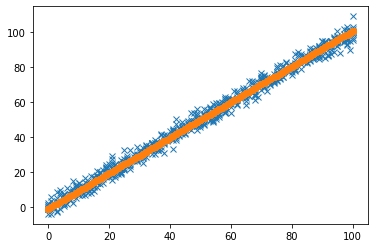

Iteration = 475, Loss = 4.024235083788693


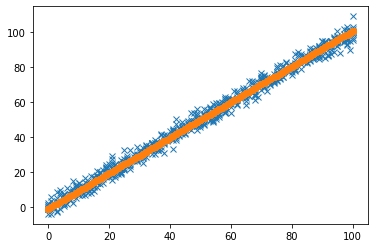

Iteration = 476, Loss = 4.0242260229215345


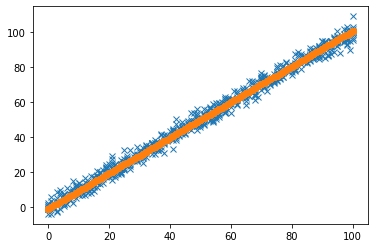

Iteration = 477, Loss = 4.02421696296297


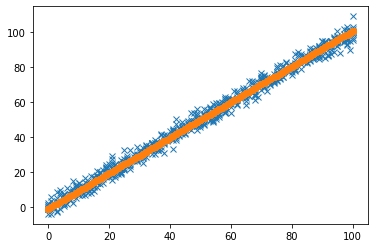

Iteration = 478, Loss = 4.024207903912908


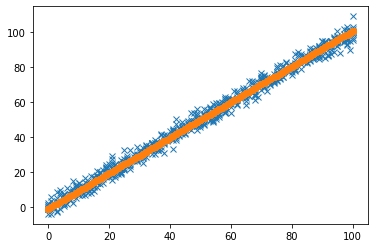

Iteration = 479, Loss = 4.024198845771255


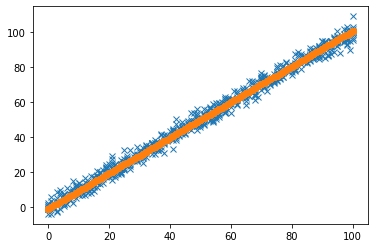

Iteration = 480, Loss = 4.024189788537924


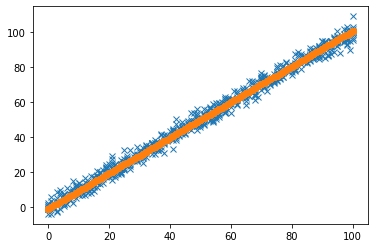

Iteration = 481, Loss = 4.0241807322128205


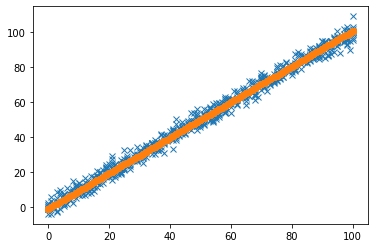

Iteration = 482, Loss = 4.0241716767958575


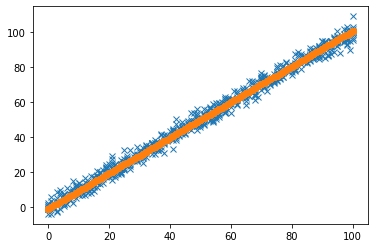

Iteration = 483, Loss = 4.024162622286937


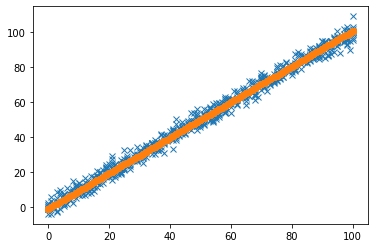

Iteration = 484, Loss = 4.024153568685974


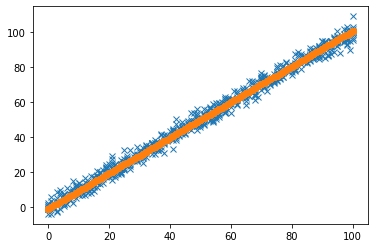

Iteration = 485, Loss = 4.024144515992877


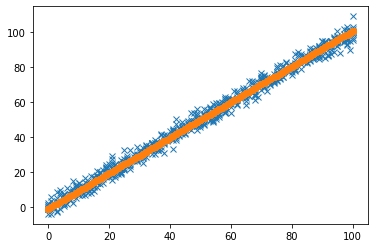

Iteration = 486, Loss = 4.024135464207552


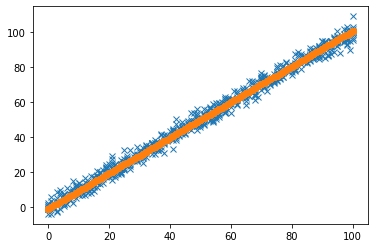

Iteration = 487, Loss = 4.02412641332991


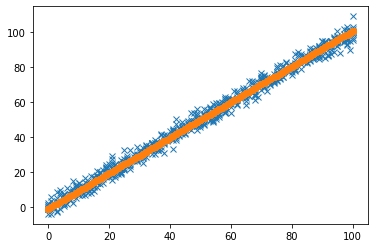

Iteration = 488, Loss = 4.024117363359859


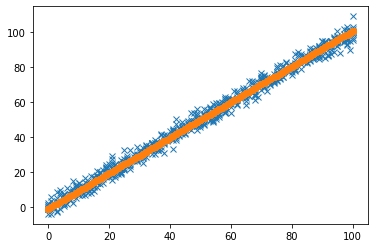

Iteration = 489, Loss = 4.024108314297308


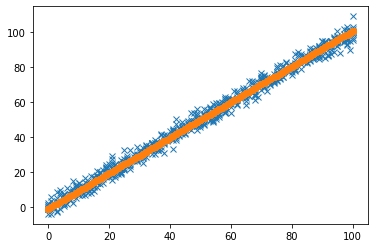

Iteration = 490, Loss = 4.0240992661421675


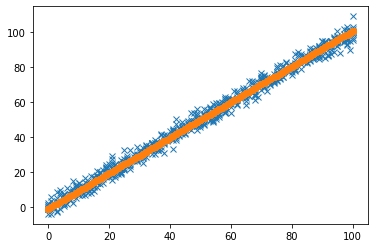

Iteration = 491, Loss = 4.024090218894345


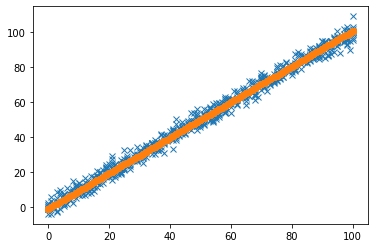

Iteration = 492, Loss = 4.024081172553749


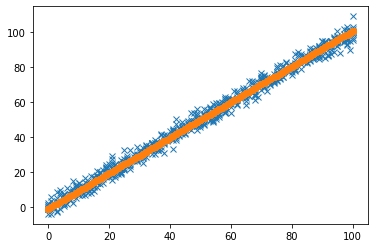

Iteration = 493, Loss = 4.0240721271202915


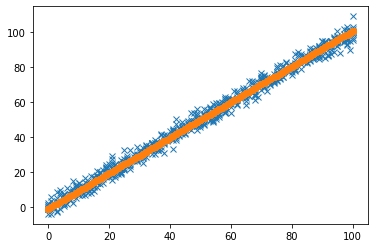

Iteration = 494, Loss = 4.0240630825938775


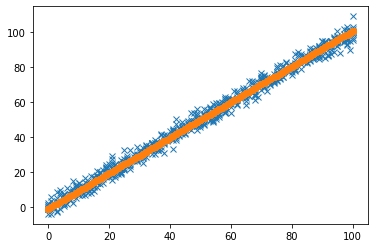

Iteration = 495, Loss = 4.024054038974419


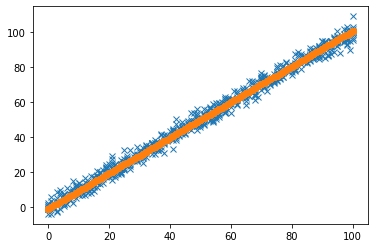

Iteration = 496, Loss = 4.024044996261824


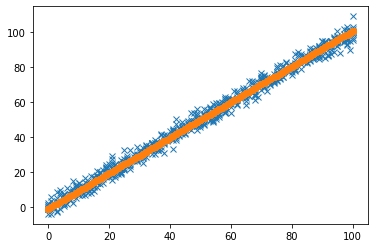

Iteration = 497, Loss = 4.024035954456003


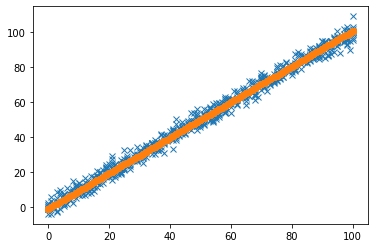

Iteration = 498, Loss = 4.024026913556861


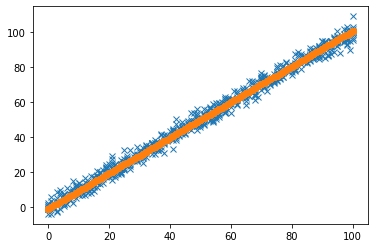

Iteration = 499, Loss = 4.024017873564313


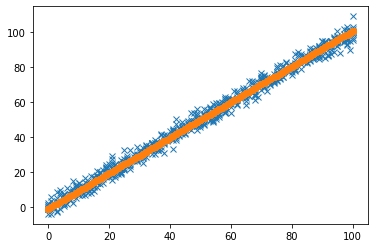

Iteration = 500, Loss = 4.024008834478263


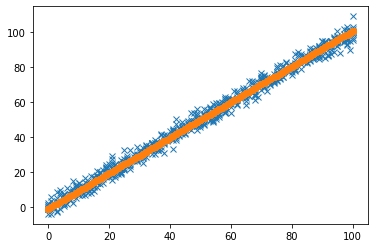

In [112]:
learning_rate = 0.0001
parameters = train(x_train, y_train, learning_rate, iters = 500)[0]

### Print your final fitted model/ validate model on test data set

In [113]:
print("intercept: {}".format(parameters['b0']))

intercept: -0.9550974893396305


In [114]:
print("coefficient: {}".format(parameters['b1']))

coefficient: 1.0133583947578508


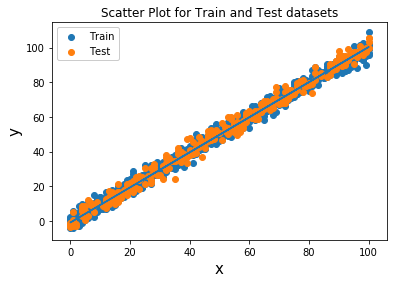

In [115]:
plt.scatter((dt1b['x']),dt1b['y'], label="Train")
plt.title("Scatter Plot for Train and Test datasets")
plt.xlabel("x", fontsize=15)
plt.ylabel("y", fontsize=15)

plt.scatter((dt1t['x']),dt1t['y'], label="Test")

plt.legend(framealpha=1, frameon=True)

plt.plot((dt1b['x']), (parameters['b0'] + parameters['b1']*(dt1b['x'])))